# **<font color='crimson'>ПРОЕКТ «Определение рыночной стоимости автомобилей»</font>**

**Выполнил**: Юмаев Егор

## <font color='green'>**Введение. Описание проекта, его цель и задачи**</font>

---

Новым популярным сервисом, привлекающим на интернет-сайт пользователей, является возможность бесплатно оценить объект недвижимости или движимое имущество – автомобиль. Например, чтобы понять, квартира переоценена продавцом или указанная стоимость соответствует сложившейся рыночной конъюнктуре, достаточно просто ввести адрес, количество квадратных метров и тип квартиры:

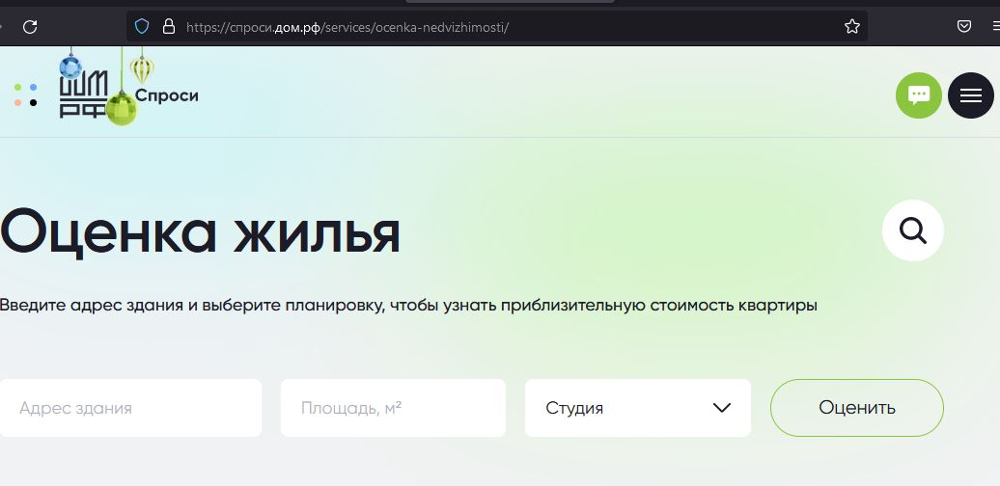

В случае, если портал обладает меньшей базой, для определения взвешенной рыночной стоимости потребуется ввести больше параметров:

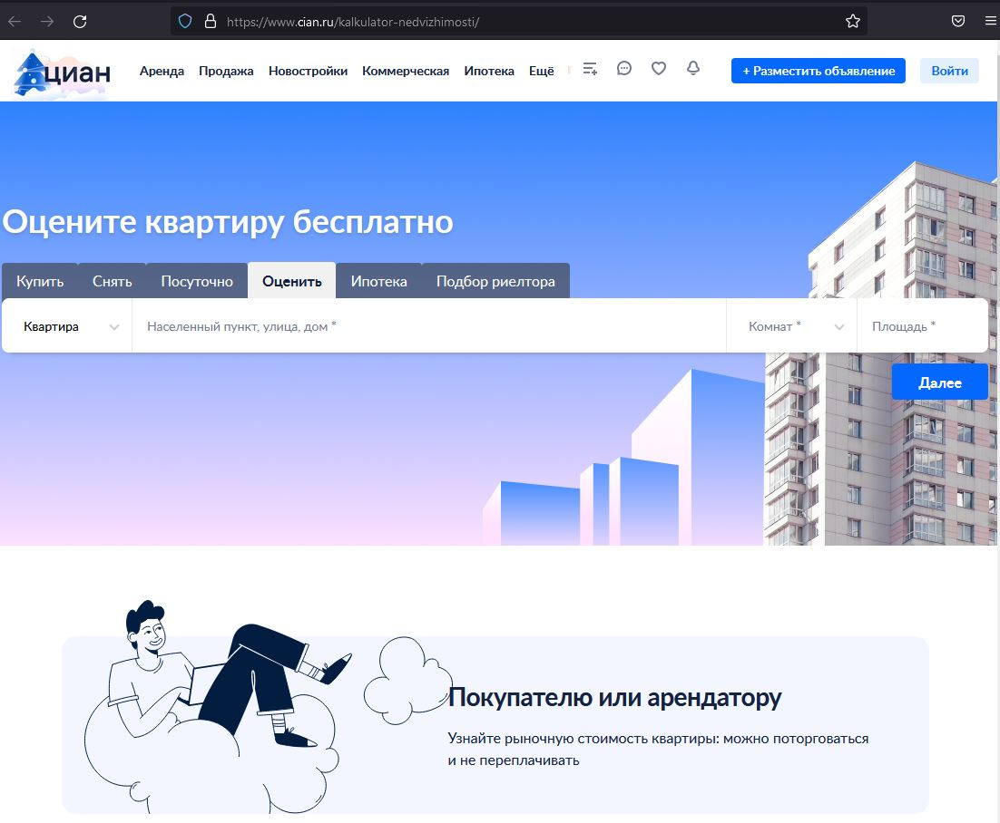

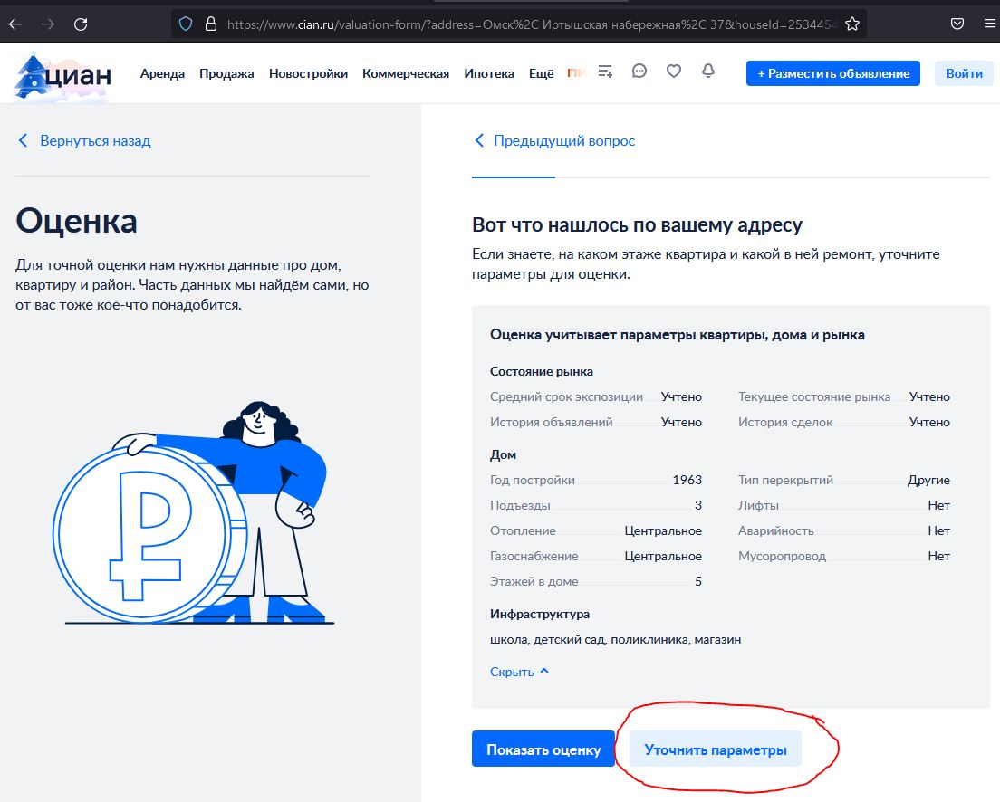

Автомобильные порталы в борьбе за внимание пользователей предлагают сервисы по оценке реальной рыночной стоимости автомобиля:

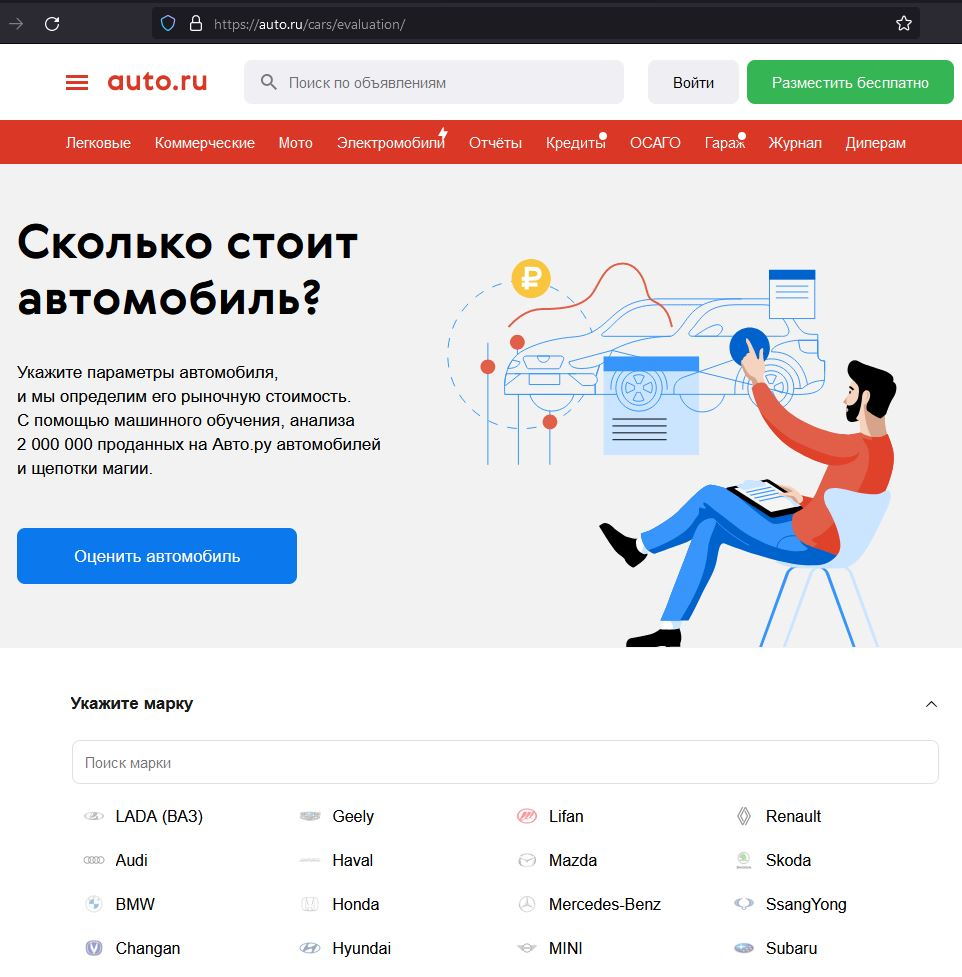

Если оценка, сформированная в результате машинного обучения, будет соответствовать рыночным реалиям - популярность сайта будет расти. Если не будет – пользователи уйдут на конкурирующие площадки, которые смогут быстро наращивать базу объявлений, повышая тем самым качество предсказания своих моделей машинного обучения. Соответственно, при внедрении сервиса должна быть обеспечена высокая точность предсказанной алгоритмом цены автомобиля.

Популярный среди автолюбителей портал по продаже автомобилей с пробегом «Не бит, не крашен» разрабатывает приложение для привлечения новых клиентов и расширения своего присутствия в онлайн-пространстве. Новый сервис должен позволить быстро узнать рыночную стоимость автомобиля. Администрацией портала накоплены исторические данные: технические характеристики, комплектации и цены автомобилей, – которые станут основой для обучения машинного алгоритма.

**Цель исследования**: разработка модели машинного обучения, предсказывающей рыночную стоимость автомобиля.

Для достижения цели были выполнены следующие **задачи**:

 * проведен исследовательский анализ данных; данные подготовлены для машинного обучения

 * проведено обучение нескольких моделей с подбором лучших гиперпараметров для каждой модели

 * проанализировано время обучения модели; время, затраченное моделью на предсказание; качество модели

 * выбрана лучшая модель, качество которой проверено на тестовой выборке

Заказчиком определены следующие **критерии**, по которым будет выбрана лучшая модель:

 - должно быть исследовано несколько моделей, одна из которых — LightGBM, как минимум одна — не бустинг

 - время обучения модели

 - время, затраченное моделью на предсказание

 - качество модели, определяемое по метрике RMSE, значение которой должно быть ниже 2500

## <font color='green'>**1 Исследовательский анализ данных**</font>

---

### **1.1. Импорт необходимых библиотек, структур данных и функций. Загрузка данных**

---

In [ ]:
# устанавливаем библиотеку skimpy,
# функция из которой понадобится для приведения названий
# столбцов датасета к snake_case
!pip install -q skimpy

# устанавливаем библиотеку joypy для построения графика Joy,
# позволяющего визуализировать распределение значений (целевого) признака
!pip install -q joypy

# устанавливаем библиотеку feature_engine,
# функция из которой будет использована для удаления признаков
# с высокой линейной корреляцией
!pip install -q feature_engine

# устанавливаем библиотеку catboost, модель из которой
# потребуется для машинного обучения
!pip install -q catboost

In [2]:
# импортируем необходимые библиотеки, структуры данных и функции

# основные библиотеки
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import joypy
from matplotlib import rcParams, rcParamsDefault
from skimpy import clean_columns
from datetime import datetime

# заполнение пропусков в числовых и категориальных признаках
from sklearn.impute import KNNImputer, SimpleImputer

# масштабирование числовых признаков
from sklearn.preprocessing import MinMaxScaler

# кодирование признаков
from sklearn.preprocessing import OneHotEncoder, OrdinalEncoder

# подготовка к машинному обучению
from sklearn.model_selection import train_test_split
from sklearn.compose import make_column_selector as selector
from feature_engine.selection import DropCorrelatedFeatures
from sklearn.feature_selection import SelectKBest, mutual_info_regression

# кроссвалидация
from sklearn.model_selection import RandomizedSearchCV, KFold

# модели машинного обучения
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import Ridge, LassoCV
from catboost import CatBoostRegressor
from sklearn.ensemble import HistGradientBoostingRegressor
from lightgbm import LGBMRegressor
from sklearn.dummy import DummyRegressor

# метрики машинного обучения
from sklearn.metrics import make_scorer, mean_squared_error

# убираем 'красные' предупреждения
import warnings
warnings.filterwarnings("ignore")

In [3]:
# настраиваем параметры отображения рисунков
rcParams['figure.figsize'] = 12,12
%config InlineBackend.figure_format = 'svg'
%matplotlib inline
factor = 10
default_dpi = rcParamsDefault['figure.dpi']
rcParams['figure.dpi'] = default_dpi*factor

In [4]:
# для того, чтобы обеспечить "читаемость" всех столбцов,
# применим функцию pd.set_option()
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

In [5]:
# подгружаем файл с данными
try:
    data = pd.read_csv('/datasets/autos.csv')

    print('Datasets load from Practicum cloud')
except:
    data = pd.read_csv('https://code.s3.yandex.net/datasets/autos.csv')

    print('Datasets load from Web')

Datasets load from Web


In [6]:
# проверим, загружены ли данные, для чего выведем первые пять строк датасета
data.head()

,DateCrawled,Price,VehicleType,RegistrationYear,Gearbox,Power,Model,Kilometer,RegistrationMonth,FuelType,Brand,Repaired,DateCreated,NumberOfPictures,PostalCode,LastSeen
0,2016-03-24 11:52:17,480,NaN,1993,manual,0,golf,150000,0,petrol,volkswagen,NaN,2016-03-24 00:00:00,0,70435,2016-04-07 03:16:57
1,2016-03-24 10:58:45,18300,coupe,2011,manual,190,NaN,125000,5,gasoline,audi,yes,2016-03-24 00:00:00,0,66954,2016-04-07 01:46:50
2,2016-03-14 12:52:21,9800,suv,2004,auto,163,grand,125000,8,gasoline,jeep,NaN,2016-03-14 00:00:00,0,90480,2016-04-05 12:47:46
3,2016-03-17 16:54:04,1500,small,2001,manual,75,golf,150000,6,petrol,volkswagen,no,2016-03-17 00:00:00,0,91074,2016-03-17 17:40:17
4,2016-03-31 17:25:20,3600,small,2008,manual,69,fabia,90000,7,gasoline,skoda,no,2016-03-31 00:00:00,0,60437,2016-04-06 10:17:21


### **1.1 Импорт необходимых библиотек, структур данных и функций. Загрузка данных**


---

**(1)** необходимые библиотеки, структуры данных и функции импортированы; настроены параметры отображения рисунков

**(2)** данные загружены и готовы для исследовательского анализа

### **1.2 Изучение данных, обработка аномалий, удаление неинформативных признаков**

---

In [7]:
# проверим размер датасета
data.shape, data.size

((354369, 16), 5669904)

Исходный датасет включает 16 признаков и 354 тыс. наблюдений.

In [8]:
# проверим названия колонок
data.columns

Index(['DateCrawled', 'Price', 'VehicleType', 'RegistrationYear', 'Gearbox',
       'Power', 'Model', 'Kilometer', 'RegistrationMonth', 'FuelType', 'Brand',
       'Repaired', 'DateCreated', 'NumberOfPictures', 'PostalCode',
       'LastSeen'],
      dtype='object')

Названия колонок не соответствуют общепринятому стилю 'snake case'

In [9]:
# приводим названия колонок датасета к стилю 'snake_case'
data = clean_columns(data)

# проверяем стиль написания заголовков
data.columns

Index(['date_crawled', 'price', 'vehicle_type', 'registration_year', 'gearbox',
       'power', 'model', 'kilometer', 'registration_month', 'fuel_type',
       'brand', 'repaired', 'date_created', 'number_of_pictures',
       'postal_code', 'last_seen'],
      dtype='object')

In [10]:
# проверим тип данных в столбцах датасета
data.dtypes, data.dtypes.value_counts()

(date_crawled          object
 price                  int64
 vehicle_type          object
 registration_year      int64
 gearbox               object
 power                  int64
 model                 object
 kilometer              int64
 registration_month     int64
 fuel_type             object
 brand                 object
 repaired              object
 date_created          object
 number_of_pictures     int64
 postal_code            int64
 last_seen             object
 dtype: object,
 object    9
 int64     7
 Name: count, dtype: int64)

Датасет включает девять столбцов с типом object и семь столбцов с типом int64. Для машинного обучения необходимо передавать признаки только числового типа. Необходимо либо измеить тип данных, либо удалить некотоыре признаки, если они являются неинформативными.

In [11]:
# изучим общую статистическую сводку о датасете
data.describe().T

,count,mean,std,min,25%,50%,75%,max
price,354369.0,4416.656776,4514.158514,0.0,1050.0,2700.0,6400.0,20000.0
registration_year,354369.0,2004.234448,90.227958,1000.0,1999.0,2003.0,2008.0,9999.0
power,354369.0,110.094337,189.850405,0.0,69.0,105.0,143.0,20000.0
kilometer,354369.0,128211.172535,37905.341530,5000.0,125000.0,150000.0,150000.0,150000.0
registration_month,354369.0,5.714645,3.726421,0.0,3.0,6.0,9.0,12.0
number_of_pictures,354369.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0
postal_code,354369.0,50508.689087,25783.096248,1067.0,30165.0,49413.0,71083.0,99998.0


Метод describe() дает информацию только по числовым столбцам. Выделим проблемные столбцы:

 - **‘registration_year’**: минимальный год регистрации 1000, максимальный - 9999. Следовательно, необходимо определить количество значений, являющихся выбросами и принять решение об их удалении или применении заглушки NaN для последующего заполнения пропусков

 - **‘power’**: минимальная мощность двигателя 0 (ноль) лошадиных сил. Можно предположить, что на продажу выставлен автомобиль без двигателя. Это маловероятно и окончательное решение о том, что делать с нулевыми или близкими к ним значениями примем после детального изучения признака. Максимальное количество лошадиных сил двигателя в 20000 абсолютно нереалистично, т.к. среди современных легковых автомобилей лишь немногие имеют более 1000 лошадиных сил. Один из рекордсменов среди легковых автомобилей: ‘Hennessey Venom GT’ имеет двигатель в 1261 л.с. Чемпионом среди грузовых автомобилей считается американский карьерный самосвал Caterpillar 797F – огромная машина, мощностью 4000 лошадиных сил. Если судить по техзаданию: «Сервис по продаже автомобилей с пробегом «Не бит, не крашен» разрабатывает приложение для привлечения новых клиентов», - речь идет именно о легковых, а не грузовых автомобилях. Поэтому выбросы в сторону максимального значения также будут исследованы и все выбросы свыше 1000 лошадиных сил будут обработаны. Мы можем предполагать наличие среди рекламных объявлений подержанных спорткаров, но их количество точно не будет велико, и только помешает машинному обучению

  * 15 лучших автомобилей мощностью 1000 л.с. и более // 1Gai.Ru – Советы и технологии, автомобили, новости, статьи… . – URL: https://1gai.ru/publ/515244-15-luchshih-avtomobiley-moschnostyu-1000-ls-i-bolee.html

  * Самые мощные автомобили в мире // Аренда авто в Санкт-Петербурге, прокат автомобиля без водителя. – URL: https://www.arenda-auto.ru/news/samye-moshchnye-avtomobili-v-mire.html#:~:text=%D0%A7%D0%B5%D0%BC%D0%BF%D0%B8%D0%BE%D0%BD%D0%BE%D0%BC%20%D1%81%D1%87%D0%B8%D1%82%D0%B0%D0%B5%D1%82%D1%81%D1%8F%20%D0%B0%D0%BC%D0%B5%D1%80%D0%B8%D0%BA%D0%B0%D0%BD%D1%81%D0%BA%D0%B8%D0%B9%20%D0%BA%D0%B0%D1%80%D1%8C%D0%B5%D1%80%D0%BD%D1%8B%D0%B9%20%D1%81%D0%B0%D0%BC%D0%BE%D1%81%D0%B2%D0%B0%D0%BB,%D1%82%D0%BE%D0%BF%D0%BB%D0%B8%D0%B2%D0%BD%D0%BE%D0%B3%D0%BE%20%D0%B1%D0%B0%D0%BA%D0%B0%20%E2%80%94%20%D0%B1%D0%BE%D0%BB%D0%B5%D0%B5%206000%20%D0%BB.

- **‘kilometer’**: обращает на себя внимание тот факт, что 50%-й квантиль, 75%-й квантиль и максимальное значение совпадают и равны 150 тыс. км. 25%-й квантиль равен 125 тыс. км, а минимальное значение – 5 тыс. км. Вероятно, при заполнении объявления на портале было ограниченное число вариантов километража пробега автомобиля. Дополнительно изучим этот вопрос далее

- **‘registration_month’**: есть объявление или объявления, в которых месяц регистрации указан как ‘0’. Это ошибочно введенное значение. Признак указывает на месяц регистрации автомобиля, не является информативным и планируется к удалению


In [12]:
# определим количество пропусков в столбцах датасета
data.isna().sum().sort_values(ascending = False)

repaired              71154
vehicle_type          37490
fuel_type             32895
gearbox               19833
model                 19705
date_crawled              0
price                     0
registration_year         0
power                     0
kilometer                 0
registration_month        0
brand                     0
date_created              0
number_of_pictures        0
postal_code               0
last_seen                 0
dtype: int64

In [13]:
# определим долю пропусков в % по признакам датасета
data.isna().mean().sort_values(ascending = False)

repaired              0.200791
vehicle_type          0.105794
fuel_type             0.092827
gearbox               0.055967
model                 0.055606
date_crawled          0.000000
price                 0.000000
registration_year     0.000000
power                 0.000000
kilometer             0.000000
registration_month    0.000000
brand                 0.000000
date_created          0.000000
number_of_pictures    0.000000
postal_code           0.000000
last_seen             0.000000
dtype: float64

Пропуски есть в пяти столбцах, количество пропусков значительно. Заполнению пропусков будет посвящен следующий подраздел.

Проведем проверку на дубликаты и удалим их, еcли они присутствуют в датасете.

In [14]:
# проверим датасет на наличие явных дубликатов
data.duplicated().sum()

4

Количество явных дубликатов: четыре. Удалим их, и повторно проверим датасет на явные дубликаты после того, как удалим неинформативные признаки, обработаем выбросы и заполним пропущенные значения.

In [15]:
# удаляем явные дубликаты
data = data.drop_duplicates()

In [16]:
# проверим датасет на наличие явных дубликатов после их удаления
data.duplicated().sum()

0

Далее предметно изучим признаки датасета на наличие выбросов.

Для последующего анализа создадим функцию, которая позволит визуализировать выбросы (boxplot) и распределение значений признаков (hist).

In [17]:
def outliers_and_features_distribution(data, name, description, color):
    """зададим параметры диаграммы 'ящик с усами' """
    plt.figure(figsize = (10, 1))
    h = sns.boxplot(x = data[name],
            data = data,
            linewidth=2.5,
            width=0.5)
    plt.xlabel(f'{description}', fontsize=12)
    plt.title(f'Выбросы в признаке {name}', fontsize = 12)
    h.tick_params(axis='x', labelrotation=0, labelsize=12)
    h.set_facecolor(color)
    plt.show()

    """зададим параметры гистограммы """
    plt.figure(figsize = (8,3))
    h = data[name].plot(
        kind = 'hist', bins = 30, label = name,
        legend = False, grid = True, color = color
        )
    plt.title(f'Распределение значений в признаке\n {name}', fontsize = 12)
    plt.xlabel(f'{description}', fontsize=12)
    plt.show()

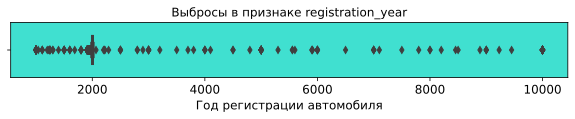

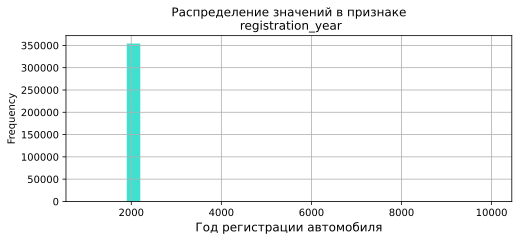

In [18]:
# проверим работу функции outliers_and_features_distribution()
outliers_and_features_distribution(
    data,
    'registration_year',
    'Год регистрации автомобиля',
    'turquoise')

Детальный анализ признаков датасета начнем с удаления тех признаков, котоыре однозначно не являются информативными и не могут определять цену автомобиля:

 * 'date_crawled' (дата скачивания анкеты из базы)

 * 'registration_month' (месяц регистрации автомобиля)

 * 'postal_code' (почтовый индекс владельца анкеты (пользователя))

 * 'last_seen' (дата последней активности пользователя)

 Удалим указанные признаки из датасета.

In [19]:
# проверим размер датасета до удаления четырех неинформативных признаков
data.shape

(354365, 16)

In [20]:
# удалим неинформативные признаки
data.drop(['date_crawled',
           'registration_month',
           'postal_code',
           'last_seen'],
           axis = 1,
           inplace = True
)

In [21]:
# проверим размер датасета после удаления четырех неинформативных признаков
data.shape

(354365, 12)

Еще один признак не является информативным: 'date_created' (дата создания анкеты). Тип данных столбца - 'object'. Изменим тип данных на datetime, чтобы более подробно изучить даты размещения объявлений. Это тем более важно, что для прогнозирования нам необходимы данные за последние несколько лет, поэтому требуется проверить временной диапазон размещения объявлений и убедиться, что представлены данные за актуальный период.

In [22]:
# изменим тип данных столбца 'date_created' на date time
data.date_created = pd.to_datetime(
    data.date_created)

In [23]:
# првоерим изменение типа даных столбца 'date_created'
data.dtypes

price                          int64
vehicle_type                  object
registration_year              int64
gearbox                       object
power                          int64
model                         object
kilometer                      int64
fuel_type                     object
brand                         object
repaired                      object
date_created          datetime64[ns]
number_of_pictures             int64
dtype: object

In [24]:
# посмотрим самую раннюю и позднюю дату
# объявления о продаже автомобиля
print('Дата самого раннего объявления: \n', data['date_created'].min())
print('Дата самого позднего объявления: \n', data['date_created'].max())

Дата самого раннего объявления: 
 2014-03-10 00:00:00
Дата самого позднего объявления: 
 2016-04-07 00:00:00


In [25]:
# в датасете data создадим столбец 'year',
# содержащий информаицю о годе размещения объявления
data['year'] = data['date_created'].dt.year

In [26]:
data.year.value_counts(ascending = False, dropna = False)

year
2016    354339
2015        25
2014         1
Name: count, dtype: int64

Практически все анкеты о продаже автомобиля созданы в 2016 году. Единичные анкеты, созданные в 2014-м и 2015-м не будут учтены как выброс, т.к. неинформативный признак 'date_created' и вспомогательный столбец 'year' будут удалены. Главное, мы убедились, что датасет включает данные за последние три года, фактически - за первые четыре месяца 2016 года (по отношению к 8 апреля 2016 г.). Устаревшие данные объявлений о продаже (старше трех лет) датасет не содержит. Доля объявлений, сделанных более 4 месяцев назад, фактически равна нулю.

In [27]:
# проверим размер датасета до удаления
# неинформативных признаков 'date_created' и 'year'
data.shape

(354365, 13)

In [28]:
# удалим неинформативные признаки
data.drop(['date_created',
           'year'],
           axis = 1,
           inplace = True
)

In [29]:
# проверим размер датасета после удаления неинформативных признаков
data.shape

(354365, 11)

Проверим наличие явных дубликатов после удаления пяти неинформативных признаков.

In [30]:
# проверяем наличие явных дубликатов
data.duplicated().sum()

45036

В датасете появилось чуть больше 45 тысяч дубликатов. Вероятно, преимущественно это объявления, размещенные владельцами автомобилей по несколько раз, отличавшиеся в основном датой размещения объявления. Эти наблюдения в датасете не нужны - они будут способствовать переобучению модели.

In [31]:
# удаляем явные дубликаты
data = data.drop_duplicates()

In [32]:
# проверим датасет на наличие явных дубликатов после их удаления
data.duplicated().sum()

0

In [33]:
# проверим размер датасета после второй итерации
# удаления явных дубликатов
data.shape

(309329, 11)

In [34]:
# определим количество пропусков в столбцах датасета
data.isna().sum().sort_values(ascending = False)

repaired              64558
vehicle_type          34559
fuel_type             30764
model                 18361
gearbox               17207
price                     0
registration_year         0
power                     0
kilometer                 0
brand                     0
number_of_pictures        0
dtype: int64

In [35]:
# повторно проверим долю пропусков в % по признакам датасета
data.isna().mean().sort_values(ascending = False)

repaired              0.208703
vehicle_type          0.111722
fuel_type             0.099454
model                 0.059358
gearbox               0.055627
price                 0.000000
registration_year     0.000000
power                 0.000000
kilometer             0.000000
brand                 0.000000
number_of_pictures    0.000000
dtype: float64

После удаления 45 тыс. дублирующих наблюдений абсолютное количество пропусков уменьшилось незначительно, а относительное осталось практически на одном уровне.

**Дальнейшее изучение признаков** будет построено по такому принципу:

 * проверим распределение значений в целевом признаке 'price'

 * изучим те признаки, в которых нет пропусков, - для анализа выбросов (для числовых признаков) и для анализа уникальных значений (для категориальных признаков)

 * проанализируем признаки, в которых имеются пропуски

Проверим распределение значений целевого признака **'price'** в зависимости от бренда автомобиля (признак 'brand') с поомщью joypy.joyplot.

In [36]:
# plt.figure(figsize=(10, 8))
fig, axes = joypy.joyplot(
            data,
            column = 'price',
            by = 'brand',
            color = 'orangered',
            title = 'Распределение значений целевого признака price\n в зависимости от бренда автомобиля',
            legend = True,
            figsize = (8,10))
plt.xlabel('Цена автомобиля, евро')
plt.show()

Среди объявлений о продаже преобладают недорогие автомобили. Среди дорогих выделяются audi, bmw, chevrolet, dacia, jaguar, jeep, land-rover, mini и особенно porche. Количество дорогих автомобилей значительно меньше, чем количество автомобилей среднего и дешевого сегмента. Среди доступных широкому кругу покупателей моделей особенно выделяются daewoo, daihatsu, lancia, opel, rover, trabant, fiat, ford.

Из отечественных автомобилей представлены объявления о продаже марки lada, – в бюджетном и среднем сегменте. Впрочем, среди остальных продаваемых автомобилей многие модели могли быть произведены на заводах соответствующих компаний на территории России.

Изучим общее распределение значений целевого признака 'price':

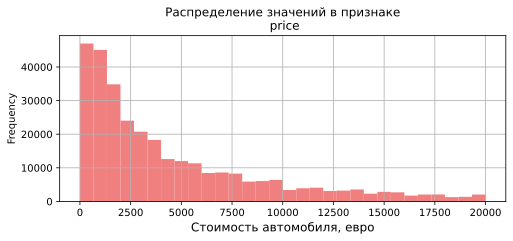

In [37]:
outliers_and_features_distribution(data,
                    'price',
                    'Стоимость автомобиля, евро',
                    'lightcoral')

In [38]:
# проверим общую статистику целевого признака 'price'
data.price.describe()

count    309329.000000
mean       4486.937196
std        4564.852796
min           0.000000
25%        1100.000000
50%        2800.000000
75%        6500.000000
max       20000.000000
Name: price, dtype: float64

Обращает на себя внимание большое количество объявлений со стоимостью автомобиля, близкой к нулю. Вероятно, разместившие объявление владельцы предполагали назвать цену непосредственно в процессе общения с потенциальными покупателями, 'по договоренности'. Но учить модель предсказывать нулевую или близкую к ней цену - бессмысленно, т.к. пользователям сервиса по определению реальной рыночной стоимости авто нужна точная цифра, а не указание на то, что может быть некая 'договоренность'.

Выбросы по цене в большую сторону не особо полезны для модели машинного обучения, но целевая аудитория, которая интересуется такими автомобилями, представляет особый интерес, поэтому их обрабатывать не будем.

Медианная стоимость автомобиля находится на уровне 2600-2700 евро. Граница 25%-го квантиля равна 1100 евро. Было бы неплохо узнать у аналитиков и/или маркетологов, какова условная нижняя граница стоимости продаваемых по состоянию на первый квартал 2016 г. автомобилей. Поскольку такой возможности нет, отфильтруем из датасета data все наблюдения, для которых цена автомобился составляет менее 300 евро.

In [39]:
# отфильтруем из датасета data все строки, для которых значение
# целевого признака составляет меньше 300 евро
data_temp = data.query('price < 300')
data_temp.shape

(20320, 11)

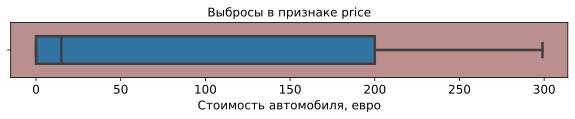

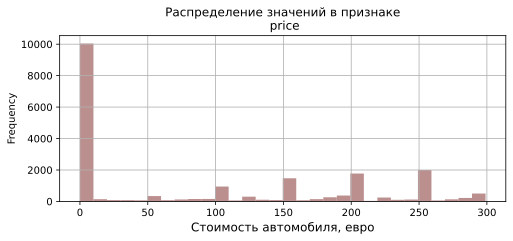

In [40]:
# проверим распределение значений целевого признака price
# в датасете data_temp
outliers_and_features_distribution(data_temp,
                    'price',
                    'Стоимость автомобиля, евро',
                    'rosybrown')

Основное количество выбросов тяготеет к нулевой отметке. Но таковыми являются далеко не все значения ниже 300 евро. Машины по оцень низкой цене продаваться тоже могут - например, на запчасти.



Нулевые значения для обучения моделей будут помехой. То же относится к слишком большим значениям. По правилу трех сигм определим нижний и верхний квантиль и удалим выбросы, котоыре выходят за пределы трех сигм.

Три сигмы охватывают 0,9973 (99,73%) значений выборки. Следовательно, необходимо определить, какие значения соответствуют квнатилям 0.00135 и 0.99865.

In [41]:
# определим значения стоимости атвомобиля, соответствующие
# нижней и верхней границе, по правилу трех сигм
data.price.quantile([0.00135, 0.99865])

0.00135        0.0
0.99865    19999.0
Name: price, dtype: float64

In [42]:
# вычислим количество значений стоимости автомобиля,
# находящихся за пределами трех сигм
auto_outliers = round((1 - data.query(
    '0 <= price <= 19999').shape[0] / data.shape[0]) * 100, 2)
print(f'Число автомобилей, стоимость которых находится за пределами трех сигм: \n \
{auto_outliers}%')

Число автомобилей, стоимость которых находится за пределами трех сигм: 
 0.07%


Количество объявлений о продаже автомобилей, цена которых выходит за пределы трех сигм, незначительно. Удалим из датасета соответствующие наблюдения.

In [43]:
# проверим размер датасета data до удаления наблюдений,
# стоимость которых выходит за пределы трех сигм
data.shape

(309329, 11)

In [44]:
# удаляем из датасета data все наблюдения,
# для которых цена автомобиля равна 0 евро и больше или равна 19999
data = data.query('price > 0 and price < 19999')

In [45]:
# проверим датасет data после удаления наблюдений
data.shape

(299950, 11)

На очередном шаге обработки значений размер датасета уменьшился на 12789 наблюдений.

Далее рассмотрим пять признаков, в которых нет пропущенных значений.

Признак **'registration_year'** отражает информацию о годе регистрации автомобиля. Определим количество уникальных значений признака и количество объявлений по каждому году регистрации.

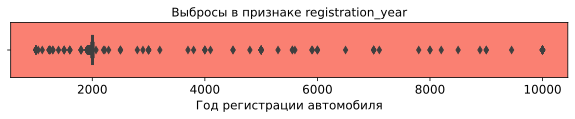

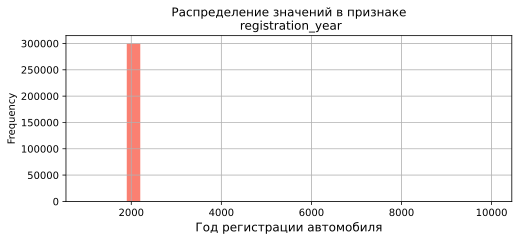

In [46]:
# проверим распределение значений признака 'registration_year'
# в датасете data
outliers_and_features_distribution(data,
                    'registration_year',
                    'Год регистрации автомобиля',
                    'salmon')

In [47]:
# посчитаем количество автомобилей по указанным в объявлении
# годам регистрации
data.registration_year.value_counts()

registration_year
2000    19820
2005    18874
1999    18255
2006    16995
2001    16821
2003    16650
2004    16621
2002    15992
2007    14845
1998    14614
2008    13443
2009    12751
1997    11809
2010     9570
2017     9276
1996     8752
2011     8599
2016     8455
1995     7835
2012     6410
1994     4128
2013     3632
2018     3539
1993     3001
1992     2616
1991     2406
1990     2312
2014     2206
1989     1158
2015     1133
1988      858
1985      637
1987      596
1980      478
1986      476
1983      378
1984      364
1982      291
1970      269
1978      257
1979      254
1981      235
1972      199
1977      159
1973      159
1974      157
1971      156
1976      151
1960      132
1975      132
1969      108
1966      107
1968       97
1967       94
1965       77
1964       57
1963       53
1910       51
1962       40
1961       37
1000       30
1959       30
1956       25
1958       19
9999       18
1950       16
2019       15
5000       15
1953       14
1955       13
19

Среди продаваемых автомобилей есть раритетные модели, зарегистрированные несколько десятков лет назад. Это вполне допустимо, однако необходимо установить нижний порог. Примем его за 1950 год: все указанные годы регистрации до 1950 года необходимо обработать.

С верхней границей года регистрации ситуация проще: т.к. выгружены данные на 7 апреля 2016 года, в объявлениях не может быть автомобилей, зарегистрированных в 2017 г. и далее. Проверять указание регистрации автомобилей с 8 апреля 2016 г. по 31 декабря 2016 г. не будем: если владелец указал дату в этот период, будем считать это технической ошибкой заполнения объявления. И, конечно же, все экзотические годы регистрации автомобилей вроде '8700' и '2290' должны быть обработаны.

Для обработки выбросов значений признака 'registration_year' применим заглушку: все значения менее 1950 и более 2016 заменим на NaN. И в той части исследовательского анализа данных, когда будет проводиться заполнение пропусков, заполним добавленные пропуски (заглушки).

In [48]:
# поставим заглушки (np.nan) вместо выбросов в признаке 'registration_year'
data.loc[data['registration_year'] < 1950, 'registration_year'] = np.nan
data.loc[data['registration_year'] > 2016, 'registration_year'] = np.nan

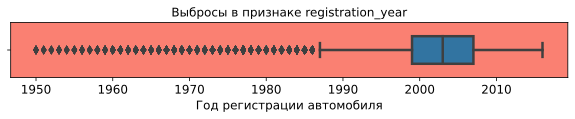

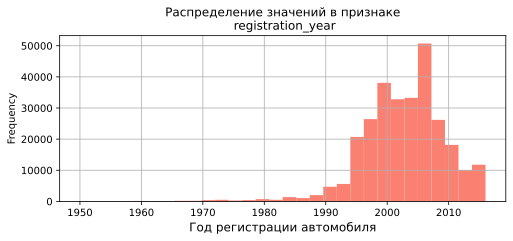

In [49]:
# проверим распределение значений признака 'registration_year'
# в датасете data после установки заглушек (np.nan)
outliers_and_features_distribution(data,
                    'registration_year',
                    'Год регистрации автомобиля',
                    'salmon')

Следующий признак для заполнения - **'power'** (мощность двигателя в лошадиных силах).

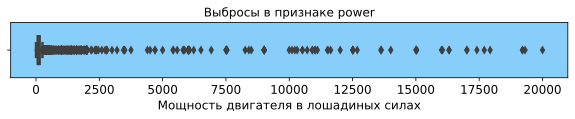

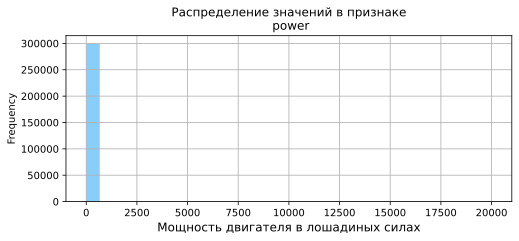

In [50]:
# проверим распределение значений признака 'power'
# в датасете data
outliers_and_features_distribution(data,
                    'power',
                    'Мощность двигателя в лошадиных силах',
                    'lightskyblue')

Мы предполагаем, что сервис будет запущен для владельцев легковых автомобилей, поэтому нереалистично указание мощности двигателя свыше 1300 лошадиных сил. Вероятно, заполняющие объявления автовладельцы имели в виду какой-то иной объем. Большой объем выбросов в районе нуля – на самом деле не означает, что это нули. В основном это правильно указанные значения.

Для малого класса городских легковых автомобилей оптимальная мощность двигателя варьируется от 80 до 110 л.с., для автомобилей С-класса: от 110 до 122 л.с., для элитных седанов – от 122 до 500 л.с., для кроссоверов – от 140 до 200 л.с., для элитных внедорожников – от 245 до 422 л.с.

 - Сапко, Д. Сколько лошадок должно быть в современном авто – выбираем по мощности / Д. Сапко // Avto-Flot.ru. – URL: https://avto-flot.ru/blog/skolko-loshadok-doljno-byit-v-sovremennom-avto-vyibiraem-po-moschnosti.html

Исходя из указанной выше информации поставим заглушку np.nan для следующих значений: ‘power’ < 70 и ‘power’ > 1300. В разделе исследовательского анализа данных, посвященном заполнению пропусков, пропуски будут заполнены.

In [51]:
# поставим заглушки (np.nan) вместо выбросов в признаке 'power'
data.loc[data['power'] < 70, 'power'] = np.nan
data.loc[data['power'] > 1300, 'power'] = np.nan

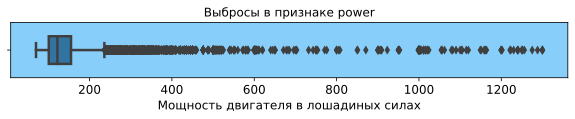

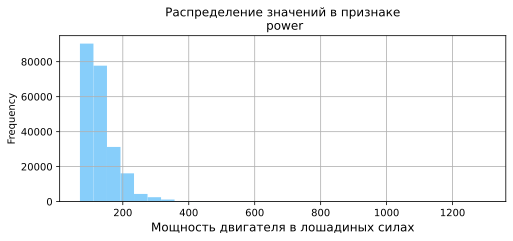

In [52]:
# проверим распределение значений признака 'power'
# в датасете data после установки заглушки
outliers_and_features_distribution(data,
                    'power',
                    'Мощность двигателя в лошадиных силах',
                    'lightskyblue')

Присутствие в признаке 'power' значений от 600 до 1300 также с высокой вероятностью можно отнести к выбросам. С другой стороны как было показано выше, среди продаваемых автомобилей есть машины дорогого сегмента, поэтому остановимся на этом варианте обработки выбросов.

Изучим распределение значений в признаке **'kilometer'** (отражает пробег автомобиля в километрах).

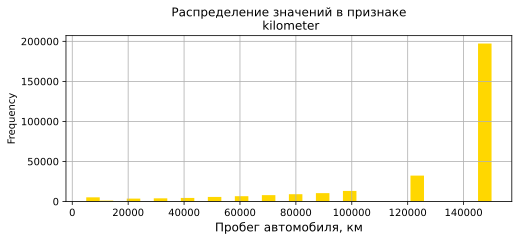

In [53]:
# проверим распределение значений признака 'kilometer'
# в датасете data
outliers_and_features_distribution(data,
                    'kilometer',
                    'Пробег автомобиля, км',
                    'gold')

In [54]:
# определим уникальные значения в признаке 'kilometer'
# и посчитаем количество объявлений по каждому значению
data.kilometer.value_counts(ascending = True)

kilometer
10000       1070
20000       3543
30000       3895
40000       4361
5000        5105
50000       5596
60000       6574
70000       7831
80000       9007
90000      10339
100000     13114
125000     32234
150000    197281
Name: count, dtype: int64

Очевидно, что при заполнении объявления установлен ограниченный набор значений признака. Продавец выбирал то значение, которое ближе к реальному пробегу автомобиля. Для более чем 2/3 объявлений указан пробег 150 тыс. км., - следовательно, речь об автомобилях, пробег которых превышает это значение. Что касается выбросов, близких к 5 тыс. – их немного. В том, что на продаже есть небольшое количество автомобилей с пробегом в районе 5 тыс. км, - ничего удивительного нет. Владелец автомобиля после его приобретения мог понять, что ему необходима машина с другими характеристиками. Или изменились жизненные обстоятельства, требующие продать автомобиль.

Выбросы в признаке 'kilometer' обрабатываться не будут. В случае, если анализ на мультиколинеарность или mutual information даст основания, признак 'kilometer' будет удален полностью.

Следующий в очереди на изучение признак, не имеющий пропусков - **'brand'**. Для изучения распределения значений в признаке построим диаграмму 'barplot'.

In [55]:
# для построения диаграммы с визуализацией распределения значений
# в признаке 'brand' создадим временный датафрейм со сгруппированным
# количеством продаваемых автомобилей в зависимости от бренда
data_temp_brand = pd.DataFrame(
    data.groupby('brand')['brand'].count().sort_values(
        ascending = False)
    )
data_temp_brand.columns = ['Количество автомобилей']
data_temp_brand = data_temp_brand.reset_index()
data_temp_brand.columns = ['Бренд', 'Количество автомобилей']
data_temp_brand.head()

,Бренд,Количество автомобилей
0,volkswagen,61804
1,opel,32776
2,bmw,30700
3,mercedes_benz,28020
4,audi,24644


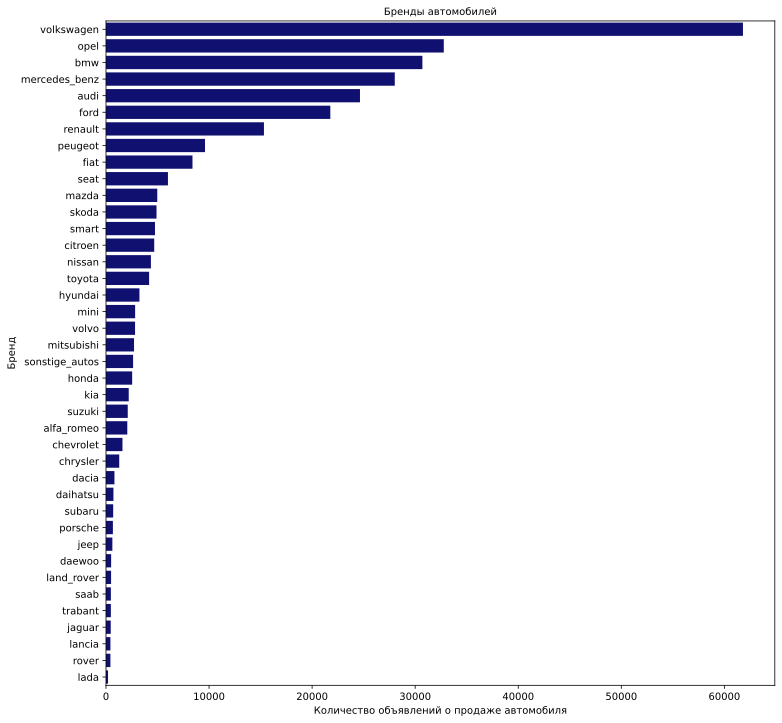

In [56]:
c = sns.barplot(data = data_temp_brand,
    x = 'Количество автомобилей',
    y = 'Бренд',
    color = 'navy')
sns.set(rc={'figure.figsize':(8,8)})
c.axes.set_title('Бренды автомобилей',fontsize=10)
c.set_xlabel('Количество объявлений о продаже автомобиля',fontsize=10)
c.set_ylabel('Бренд',fontsize=10)
c.tick_params(labelsize=10)
plt.show()

In [57]:
# посчитаем количество уникальных значений в признаке 'brand'
data.brand.nunique()

40

Большое количество уникальных значений, - 40, - повлечет за собой значительное увеличение признаков при кодировании методом OneHotEncoder для обучения линейных моделей. Потенциально к выбросам относятся бренды 'jeep', 'land_rover', 'daewoo', 'saab', 'jaguar', 'trabant', 'lancia', 'rover', 'lada'. Выбросы по признаку 'brand' обрабатываться не будут.






Среди марок автомобилей с небольшим числом объявлений есть также две, относящиеся к дорогому сегменту ('jaguar', 'jeep'). Удалять их нецелесообразно, так как для сервиса важно правильно предсказывать цены автомобилей премиального сегмента. Следовательно, остальные минимальные выбросы тоже оставим.

Итак, обработка выбросов в признаке 'brand' проводиться не будет. Применим следующий подход: все марки автомобилей, по которым количество объявлений о продаже незначительно, заменим строковым значением 'other'.

In [58]:
# заменим названия марок автомобилей, по которым подано небольшое число
# объявлений о продаже, на строковое значение 'other'
data['brand'] = [x.replace('lada', 'other') for x in data['brand']]
data['brand'] = [x.replace('jaguar', 'other') for x in data['brand']]
data['brand'] = [x.replace('land_rover', 'other') for x in data['brand']]
data['brand'] = [x.replace('lancia', 'other') for x in data['brand']]
data['brand'] = [x.replace('rover', 'other') for x in data['brand']]
data['brand'] = [x.replace('porche', 'other') for x in data['brand']]
data['brand'] = [x.replace('trabant', 'other') for x in data['brand']]
data['brand'] = [x.replace('saab', 'other') for x in data['brand']]
data['brand'] = [x.replace('daewoo', 'other') for x in data['brand']]
data['brand'] = [x.replace('jeep', 'other') for x in data['brand']]
data['brand'] = [x.replace('subaru', 'other') for x in data['brand']]
data['brand'] = [x.replace('daihatsu', 'other') for x in data['brand']]
data['brand'] = [x.replace('dacia', 'other') for x in data['brand']]

In [59]:
# проверим число уникальных значений в признаке 'brand'
# после замены
data.brand.nunique()

29

Последний признак без пропусков - 'number_of_pictures' (количество фотографий автомобиля).

In [60]:
# выведем уникальные значения признака 'number_of_pictures'
# с подсчетом количества объявлений о продаже по кажддой позиции
data.number_of_pictures.value_counts(ascending = False)

number_of_pictures
0    299950
Name: count, dtype: int64

Очевидно, что признак 'number_of_pictures' бесполезен для машинного обучения, поэтому удалим его.

In [61]:
# проверим размер датасета до удаления
# неинформативного признака 'number_of_pictures'
data.shape

(299950, 11)

In [62]:
# удалим неинформативный признак
data.drop(['number_of_pictures'],
           axis = 1,
           inplace = True
)

In [63]:
# проверим размер датасета после удаления неинформативного признака
data.shape

(299950, 10)

Третий шаг в изучении признаков датасета состоит в анализе тех признаков, в которых в исходном датасете были пропуски. Таковыми являются:

 * 'repaired'

 * 'veicle_type'

 * 'fuel_type'

 * 'model'

 * 'gearbox'

В признаке **'repaired'** отражена информация, была ли машина в ремонте, или нет.

In [64]:
# посчитаем количество объявлений по уникальным значениям
# признака 'repaired'
data.repaired.value_counts(ascending = False, dropna = False)

repaired
no     208061
NaN     60277
yes     31612
Name: count, dtype: int64

Пропуски в признаке 'repaired' будут заполнены в следующем подразделе. Никакой другой обработки значения признака не требуют.

Признак **'vehicle_type'** позволяет получить информацию о типе автомобильного кузова. Вероятнее всего количество значений ограничено. Проверим, какие типы кузова представлены в признаке и сколько объявлений о продаже автомобиля есть по каждому типу.

In [65]:
# для построения диаграммы с визуализацией распределения значений
# в признаке 'vehicle_type' создадим временный датафрейм со сгруппированным
# количеством продаваемых автомобилей в зависимости от типа кузова
data_temp_vehicle = data['vehicle_type'].fillna('missing_values')

data_temp_vehicle = pd.DataFrame(
    data_temp_vehicle.value_counts(
        ascending = False,
        dropna = False)
    )

data_temp_vehicle = data_temp_vehicle.reset_index()
data_temp_vehicle.columns = ['Тип автомобильного кузова', 'Количество автомобилей']
data_temp_vehicle

,Тип автомобильного кузова,Количество автомобилей
0,sedan,76370
1,small,65989
2,wagon,55015
3,missing_values,31647
4,bus,25415
5,convertible,17836
6,coupe,14164
7,suv,10540
8,other,2974


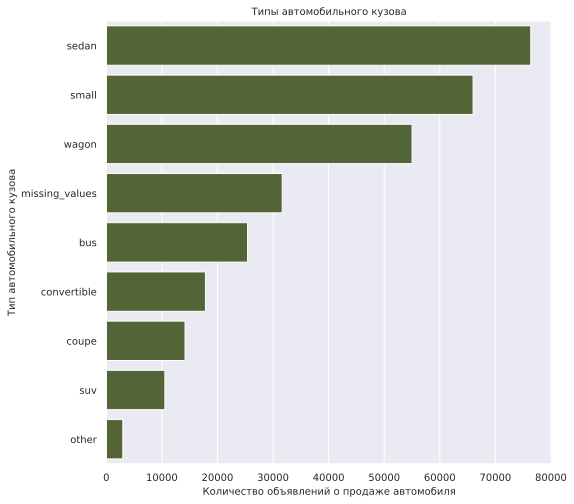

In [66]:
# построим рисунок, отражающий распределение продаваемых автомобилй
# по типу кузова
c = sns.barplot(data = data_temp_vehicle,
    x = 'Количество автомобилей',
    y = 'Тип автомобильного кузова',
    color = 'darkolivegreen')
sns.set(rc={'figure.figsize': (7, 3)})
c.axes.set_title('Типы автомобильного кузова',fontsize=10)
c.set_xlabel('Количество объявлений о продаже автомобиля',fontsize=10)
c.set_ylabel('Тип автомобильного кузова',fontsize=10)
c.tick_params(labelsize=10)
plt.show()

На рисунке не отображаются пропуски (NaN), которые в датасете data_temp занимают четвертую по убыванию строчку. В целом пропусков в признаке около 10%, они будут заполнены в следующем подразделе.

Особо отметим выброс ‘other’. Доля автомобилей с типом кузова ‘other’ невелика:

In [67]:
# рассчитаем долю автомобилей с типом кузова 'other'
print(round(data_temp_vehicle.loc[8, 'Количество автомобилей'] / \
         data_temp_vehicle['Количество автомобилей'].sum() * 100, 3), '%')

0.991 %


Количество автомобилей с типом кузова ‘other’ - менее одного процента. Но среди них могут оказаться автомобили премиального сегмента, имеющие нестандартный тип кузова. Оставим этот выброс, и в случае, если итоговая метрика не будет соответствовать пороговому уровню, удалим соответствующие наблюдения и проведем новый расчет.

Признак **'fuel_type'** позволяет получить информацию о типе топлива, потребляемого автомобилем. В этом признаке также количество вариантов значений не должно быть значительным.

In [68]:
# для построения диаграммы с визуализацией распределения значений
# в признаке 'fuel_type' создадим временный датафрейм со сгруппированным
# количеством продаваемых автомобилей в зависимости от типа потребляемого топлива
data_temp_fuel = data['fuel_type'].fillna('missing_values')

data_temp_fuel = pd.DataFrame(
    data_temp_fuel.value_counts(
        ascending = False,
        dropna = False)
    )

data_temp_fuel = data_temp_fuel.reset_index()
data_temp_fuel.columns = ['Тип топлива', 'Количество автомобилей']
data_temp_fuel

,Тип топлива,Количество автомобилей
0,petrol,182921
1,gasoline,83247
2,missing_values,28044
3,lpg,4757
4,cng,513
5,hybrid,215
6,other,166
7,electric,87


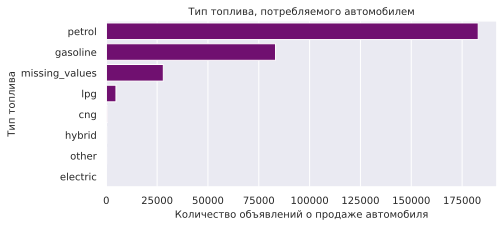

In [69]:
# построим рисунок, отражающий распределение автомобилей по типу
# потребляемого топлива
c = sns.barplot(data = data_temp_fuel,
    x = 'Количество автомобилей',
    y = 'Тип топлива',
    color = 'purple')
sns.set(rc={'figure.figsize': (8, 3)})
c.axes.set_title('Тип топлива, потребляемого автомобилем',fontsize=10)
c.set_xlabel('Количество объявлений о продаже автомобиля',fontsize=10)
c.set_ylabel('Тип топлива',fontsize=10)
c.tick_params(labelsize=10)
plt.show()

Тип топлива ‘lpg’ – это сжиженный природный газ, а ‘cng’ –сжиженный нефтяной газ. Хотя в обоих случаях ключевое слово ‘газ’, поставить знак равенства между этими типами топлива мы не можем.

 * CNG vs. LPG // Diffen. – URL: https://www.diffen.com/difference/CNG_vs_LPG

 * Difference Between CNG and LPG // BYJU’S Learning. – https://byjus.com/chemistry/difference-between-cng-and-lpg/

‘Petrol’ и ‘gasoline’ – это разное обозначение одного и того же типа топлива – бензина.

 * Difference Between Gasoline and Petrol // DifferenceBetween.com. – URL: https://www.differencebetween.com/difference-between-gasoline-and-vs-petrol/

 * Difference between Petrol and Gasoline // Difference Between | Descriptive Analysis and Comparisons. – URL: https://www.differencebetween.info/difference-between-petrol-and-gasoline

Во втором случае на первый взгляд целесообразно объединить значения ‘petrol’ и ‘gasoline’, выбрав наиболее частотное – ‘petrol’. Но в дальнейшем в продакшн модель может столкнуться с обоими вариантами типа топлива, что не пойдет на пользу качеству предсказаний. Во-первых, необходимо рекомендовать разработчикам оставить только один вариант типа топлива из двух при формировании объявления о продаже: ‘petrol’. Во-вторых, в исследовательском анализе данных будет проведена проверка на мультиколинеарность и оценено влияние признаков на целевой признак. Если полученные результаты покажут, что признак ‘fuel_tupe’ можно удалить, - удалим его. В списке на удаление признаков он – первый.

Для признака 'fuel_type' применим следующую обработку: заменим названия малочисленных категорий на строковое значение 'other'.

In [70]:
# проверим количество уникальных значений в признаке 'fuel_type'
# до обработки малочисленных категорий
data.fuel_type.unique()

array(['petrol', 'gasoline', nan, 'lpg', 'other', 'hybrid', 'cng',
       'electric'], dtype=object)

In [71]:
# названия малочисленных категорий признака 'fuel_type'
# заполняем строковым значением 'other';
# т.к. в признаке есть пропуски и с пропусками провести замену нельзя,
# сначала поставим заглушку на пропуски и после замены названий вернем пропуски

# для последующей замены строковых значений на числовые поставим заглушку
data['fuel_type'] = data['fuel_type'].fillna('missing')

In [72]:
# изменяем названия категорий
data['fuel_type'] = [x.replace('cng', 'other') for x in data['fuel_type']]
data['fuel_type'] = [x.replace('hybrid', 'other') for x in data['fuel_type']]
data['fuel_type'] = [x.replace('electric', 'other') for x in data['fuel_type']]
data['fuel_type'] = [x.replace('lpg', 'other') for x in data['fuel_type']]

In [73]:
# заглушку заменяем на пропуски, котоыре будут заполнены далее
data.loc[data['fuel_type'] == 'missing', 'fuel_type'] = np.nan

In [74]:
data.fuel_type.unique()

array(['petrol', 'gasoline', nan, 'other'], dtype=object)

Признак **'model'** позволяет установить модель продаваемого автомобиля. Для начала выясним количество значений признака.

In [75]:
# вычислим количество уникальных значений признака model
data.model.nunique()

250

In [76]:
# вычислим долю пропусков в указании модели автомобиля
print(round(data.model.isna().mean() * 100, 2), '%')

5.55 %


Итак, в признаке ‘model’ представлено 250 уникальных значений, в 5.41% случаев название модели не указано.

Последний из признаков, который необходимо рассмотреть – **'gearbox'** (тип коробки передач).

In [77]:
# вычислим количество уникальных значений признака gearbox
data.gearbox.nunique()

2

In [78]:
# для построения диаграммы с визуализацией распределения значений
# в признаке 'gearbox' создадим временный датафрейм со сгруппированным
# количеством продаваемых автомобилей в зависимости от коробки передач
data_temp_gearbox = data['gearbox'].fillna('missing_values')

data_temp_gearbox = pd.DataFrame(
    data_temp_gearbox.value_counts(
        ascending = False,
        dropna = False)
    )

data_temp_gearbox = data_temp_gearbox.reset_index()
data_temp_gearbox.columns = ['Тип коробки передач', 'Количество автомобилей']

data_temp_gearbox

,Тип коробки передач,Количество автомобилей
0,manual,226713
1,auto,57832
2,missing_values,15405


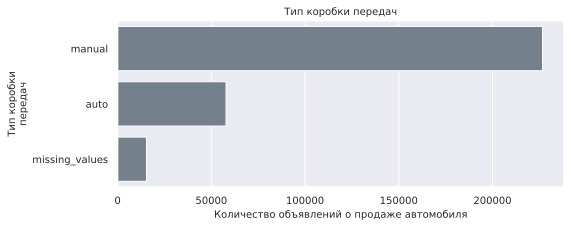

In [79]:
# построим рисунок, отражающий распределение автомобилей по типу
# потребляемого топлива
c = sns.barplot(data = data_temp_gearbox,
    x = 'Количество автомобилей',
    y = 'Тип коробки передач',
    color = 'slategray')
sns.set(rc={'figure.figsize': (8, 1)})
c.axes.set_title('Тип коробки передач',fontsize=10)
c.set_xlabel('Количество объявлений о продаже автомобиля',fontsize=10)
c.set_ylabel('Тип коробки\n передач ',fontsize=10)
c.tick_params(labelsize=10)
plt.show()

Основная часть автомобилей, предлагаемых к продаже, оснащена ручной коробкой передач. Пропусков в признаке 'gearbox' не много.

После обработки выбросов заглушками в виде np.nan и удаления всех выявленных неинформативных признаков еще раз проверим наличие явных дубликатов.

In [80]:
# проверяем наличие явных дубликатов
data.duplicated().sum()

4532

В датасете появилось чуть больше 4.4 тысяч дубликатов. Эти наблюдения в датасете не нужны - они будут способствовать переобучению модели.

In [81]:
# проверим размер датасета до третьей итерации
# удаления явных дубликатов
data.shape

(299950, 10)

In [82]:
# удаляем явные дубликаты
data = data.drop_duplicates()

In [83]:
# проверим датасет на наличие явных дубликатов после их удаления
data.duplicated().sum()

0

In [84]:
# проверим размер датасета после третьей итерации
# удаления явных дубликатов
data.shape

(295418, 10)

### **Выводы по 1.2 Изучение данных, обработка аномалий, удаление неинформативных признаков**

---

**(1)** названия признаков приведены к стилю ‘snake case’

**(2)** подготовлена функция для вывода по соответствующему признаку диаграммы ‘ящик с усами’ (визуализация выбросов) и гистограммы, отражающей распределение значений признаков

**(3)** удалены признаки, отнесенные к неинформативным: 'date_crawled' (дата скачивания анкеты из базы), 'registration_month' (месяц регистрации автомобиля), 'postal_code' (почтовый индекс владельца анкеты (пользователя)), 'last_seen' (дата последней активности пользователя), 'date_created' (дата создания анкеты), 'number_of_pictures' (количество фотографий атвомобиля).

**(4)** установлено, что датасет включает информацию об объявлениях за актуальный период (более 99% объявлений за первые четыре месяца 2016 г.), на основе выгруженных данных могут быть получены предсказания модели, соответствующие сложившейся рыночной конъюнктуре

**(5)** установлено, что среди объявлений о продаже преобладают недорогие автомобили. Среди дорогих выделяются audi, bmw, chevrolet, dacia, jaguar, jeep, land-rover, mini и особенно porche. Количество дорогих автомобилей значительно меньше, чем количество автомобилей среднего и дешевого сегмента. Среди доступных широкому кругу покупателей моделей особенно выделяются daewoo, daihatsu, lancia, opel, rover, trabant, fiat, ford

**(6)** по девяти признакам, оставшимся после удаления неинформативных признаков, проведен анализ выбросов и особенности распределения значений. С целью обработки выбросов поставлены заглушки в виде пропусков в признаках 'registration_year', 'power',

**(7)** на основе анализа значений целевого признака ‘price’ удалены все наблюдения, по которым цена автомобиля составила менее 150 евро

**(8)** проведено две итерации удаления явных дубликатов, - до и после удаления неинформативных признаков

### **1.3 Заполнение пропущенных значений**

---


Перед заполнением пропусков проверим текущую долю пропусков в признаках.

In [85]:
# определим долю пропусков в % по признакам датасета
data.isna().mean().sort_values(ascending = False)

power                0.240761
repaired             0.200177
vehicle_type         0.105153
fuel_type            0.093833
model                0.056083
gearbox              0.051781
registration_year    0.043257
price                0.000000
kilometer            0.000000
brand                0.000000
dtype: float64

In [86]:
# выведем тип данных в столбцах
data.dtypes

price                  int64
vehicle_type          object
registration_year    float64
gearbox               object
power                float64
model                 object
kilometer              int64
fuel_type             object
brand                 object
repaired              object
dtype: object

Для заполнения пропусков методом ближайших соседей (KNN Imputer) подходят столбцы 'power' и 'registration_year'. Метод KNN Imputer принимает на вход только числовые столбцы.

Остальные пять столбцов с пропусками - категориальные. Два из них: 'repaired' и 'gearbox', - включают всего два значения, которые можно заменить на числа 0 и 1 и изменить тип столбца на числовой.

In [87]:
# выведем список уникальных значений признака 'repaired'
data.repaired.unique()

array([nan, 'yes', 'no'], dtype=object)

In [88]:
# для последующей замены строковых значений на числовые поставим заглушку
data['repaired'] = data['repaired'].fillna('missing')

In [89]:
# заменяем строковые значения на числовые в признаке 'repaired'
data['repaired'] = [x.replace('yes', '1') for x in data['repaired']]
data['repaired'] = [x.replace('no', '0') for x in data['repaired']]

In [90]:
# заглушку заменяем на пропуски, котоыре будут заполнены далее
data.loc[data['repaired'] == 'missing', 'repaired'] = np.nan

In [91]:
# меняем тип данных признака 'repaired' на float64
data.repaired = data.repaired.astype('float64')

In [92]:
# выведем список уникальных значений признака 'repaired'
data.repaired.unique()

array([nan,  1.,  0.])

In [93]:
# проверим тип данных признака 'repaired'
data.repaired.dtypes

dtype('float64')

In [94]:
# выведем список уникальных значений признака 'gearbox'
data.gearbox.unique()

array(['manual', 'auto', nan], dtype=object)

In [95]:
# для последующей замены строковых значений на числовые поставим заглушку
data['gearbox'] = data['gearbox'].fillna('missing')

In [96]:
# заменяем строковые значения на числовые в признаке 'gearbox'
data['gearbox'] = [x.replace('manual', '1') for x in data['gearbox']]
data['gearbox'] = [x.replace('auto', '0') for x in data['gearbox']]

In [97]:
# заглушку заменяем на пропуски, котоыре будут заполнены далее
data.loc[data['gearbox'] == 'missing', 'gearbox'] = np.nan

In [98]:
# меняем тип данных признака 'gearbox' на float64
data.gearbox = data.gearbox.astype('float64')

In [99]:
# выведем список уникальных значений признака 'gearbox'
data.gearbox.unique()

array([ 1.,  0., nan])

In [100]:
# выведем тип данных в столбцах после обработки признаков
# 'repaired' и 'gearbox'
data.dtypes

price                  int64
vehicle_type          object
registration_year    float64
gearbox              float64
power                float64
model                 object
kilometer              int64
fuel_type             object
brand                 object
repaired             float64
dtype: object

Создадим список столбцов (признаков) датасета data с числовым типом данных, в которых есть пропуски.

In [101]:
number_na_columns = ['power',
                     'registration_year',
                     'gearbox',
                     'repaired']

In [102]:
# создаем объект KNNImputer
imputer = KNNImputer(
    n_neighbors = 5,
    copy = False
)

In [103]:
# для заполнения пропусков методом ближайших соседей
# обучаем и трансформируем числовые признаки датасета data,
# в которых есть пропуски, с помощью объекта KNNImputer

%%time

data[number_na_columns] = imputer.fit_transform(data[number_na_columns])

CPU times: user 40min 15s, sys: 11min, total: 51min 15s
Wall time: 47min 52s


In [104]:
# проверим, остались ли пропуски в столбцах (признаках) датасета data
# 'power', 'registration_year', 'gearbox', 'repaired' после их заполнения
# методом ближайших соседей
data.isna().mean().sort_values(ascending = False)

vehicle_type         0.105153
fuel_type            0.093833
model                0.056083
price                0.000000
registration_year    0.000000
gearbox              0.000000
power                0.000000
kilometer            0.000000
brand                0.000000
repaired             0.000000
dtype: float64

Пропуски в категориальных столбцах 'vehicle_type', 'fuel_type', 'model' заполним значением 'missing' с помощью метода SimpleImputer.

Создадим список столбцов (признаков) датасета data с категориальными данными, в которых есть пропуски.

In [105]:
categorical_na_columns = ['vehicle_type',
                     'fuel_type',
                     'model']

In [106]:
# создаем объект SimpleImputer
simple_imputer = SimpleImputer(
    missing_values = np.nan,
    strategy = 'constant',
    fill_value = 'missing'
)

In [107]:
# для заполнения пропусков методом SimpleImputer
# обучаем и трансформируем категориальные признаки датасета data,
# в которых есть пропуски, с помощью объекта SimpleImputer

%%time

data[categorical_na_columns] = simple_imputer.fit_transform(
    data[categorical_na_columns])

CPU times: user 109 ms, sys: 163 µs, total: 109 ms
Wall time: 109 ms


In [108]:
# проверим, остались ли пропуски в столбцах (признаках) датасета data
# 'vehicle_type', 'fuel_type', 'model' после их заполнения
# методом SimpleImputer
data.isna().mean().sort_values(ascending = False)

price                0.0
vehicle_type         0.0
registration_year    0.0
gearbox              0.0
power                0.0
model                0.0
kilometer            0.0
fuel_type            0.0
brand                0.0
repaired             0.0
dtype: float64

In [109]:
# проверим наличие явных дубликатов после заполнения пропусков
data.duplicated().sum()

2216

In [110]:
# перед удалением явных дубликатов проверим размер датасета
data.shape

(295418, 10)

In [111]:
# удалим явные дубликаты
data = data.drop_duplicates()

In [112]:
# проверим наличие явных дубликатов после их удаления
data.duplicated().sum()

0

In [113]:
# проверим размер датасета
data.shape

(293202, 10)

### **Выводы по 1.3 Заполнение пропущенных значений**

---

**(1)** значения категориальных признаков, являющихся бинарными (‘repaired’, ‘gearbox’) заполнены числовыми признаками 0 и 1, тип данных признаков изменен на float64, – это позволило заполнить пропуски в указанных признаках методом KNN Imputer

**(2)** пропуски в числовых столбцах (признаках) 'power', 'registration_year', 'gearbox', 'repaired' заполнены методом KNNImputer

**(3)** пропуски в категориальных столбцах (признаках) 'vehicle_type', 'fuel_type', 'model' заполнены методом SimpleImputer (пропуски заменены на строковое значение ‘missing’)

### **1.4 Разделение датасета data на датасеты с признаками и целевым признаком**

---

In [114]:
# выделим обучающие признаки и целевой признак
features = data.drop(['price'], axis = 1)
target = data['price']

# проверим размер датасетов с обучающими признаками и целевым признаком
features.shape, target.shape

((293202, 9), (293202,))

### **Выводы по 1.4 Формирование обучающего и тестового комплекта из датасета data**

---

**(1)** из датасета data выделены датасет с признаками 'features' и датасет с целевым признаком 'target'

### **1.5 Уточнение подхода к кодированию и масштабированию признаков в зависимости от типа обучаемой модели**

---


Для достижения поставленной цели будут протестированы семь моделей. Особенности кодирования категориальных признаков и масштабирования числовых признаков различается в зависимости от принадлежности модели к определённому классу. Основными классами являются модели, основанные на деревьях, и линейные модели.

Две из отобранных моделей относятся к семейству линейных моделей. Назовем их **'простые / simple'**:

 * Ridge

 * LassoCV

Для **'простых'** моделей применим:

 * OneHotEncoder

 * MinMaxScaler (нормализация значений)

Пять из отобранных моделей относятся к семейству деревьев. Назовем их **'сложные / complex'**:

 * DecisionTreeRegessor

 * RandomForestRegressor

 * HistGradientBoostingRegressor

 * CatBoostRegressor

 * LGBMRegressor

Для **'сложных'** моделей применим:

 * OrdinalEncoder

### **Вывод по 1.5 Уточнение подхода к кодированию и масштабированию признаков в зависимости от типа обучаемой модели**

---

**(1)** уточнен подход дальнейшей подготовки признаков для машинного обучения

**(2)** для простых (линейных) моделей будет использован OneHotEncoder и MinMaxScaler

**(3)** для сложных (основанных на деревьях) моделях будет использован OrdinalEncoder

### **1.6 Кодирование и масштабирование признаков для простых (линейных) моделей**

---

In [115]:
# проверим размер датасета features
features.shape, target.shape

((293202, 9), (293202,))

In [116]:
# сформируем обучающий и тестовый комплект
# из датасетов features и target
features_train_simple, features_test_simple, \
target_train_simple, target_test_simple = train_test_split(
    features, target,
    test_size = .25,
    random_state = 1,
    shuffle = True)

In [117]:
# проверим размеры датасетов обучающего комплекта
features_train_simple.shape, target_train_simple.shape

((219901, 9), (219901,))

In [118]:
# проверим размеры датасетов тестового комплекта
features_test_simple.shape, target_test_simple.shape

((73301, 9), (73301,))

Для того, чтобы закодировать категориальные признаки методом OneHotEncoder, потребуется отделить категориальыне признаки от числовых. Из каждого из датасетов: features_train_simple и features_test_simple создадим по два датасета: в один войдут все категориальные признаки, в другой - числовые.

In [119]:
# создадим список столбцов (признаков),
# относящихся к категориальному типу данных
categorical_columns_selector = selector(dtype_include = object)
categorical_columns = categorical_columns_selector(features)
categorical_columns

['vehicle_type', 'model', 'fuel_type', 'brand']

In [120]:
# создадим датасет, включающий категориальные признаки
features_train_simple_categorical = features_train_simple[categorical_columns]

# выведем тип данных признаков датасета features_train_simple_categorical
features_train_simple_categorical.dtypes

vehicle_type    object
model           object
fuel_type       object
brand           object
dtype: object

In [121]:
# создадим датасет, включающий категориальыне признаки
features_test_simple_categorical = features_test_simple[categorical_columns]

# выведем тип данных признаков датасета features_test_simple_categorical
features_test_simple_categorical.dtypes

vehicle_type    object
model           object
fuel_type       object
brand           object
dtype: object

In [122]:
# создадим список столбцов (признаков),
# относящиеся к числовому типу данных
numerical_columns_selector = selector(dtype_include = ['int64', 'float64'])
numerical_columns = numerical_columns_selector(features)
numerical_columns

['registration_year', 'gearbox', 'power', 'kilometer', 'repaired']

In [123]:
# создадим датасет, включающий числовые признаки
features_train_simple_numerical = features_train_simple[numerical_columns]

# выведем тип данных признаков датасета features_train_simple_numerical
features_train_simple_numerical.dtypes

registration_year    float64
gearbox              float64
power                float64
kilometer              int64
repaired             float64
dtype: object

In [124]:
# создадим датасет, включающий числовые признаки
features_test_simple_numerical = features_test_simple[numerical_columns]

# выведем тип данных признаков датасета features_test_simple_numerical
features_test_simple_numerical.dtypes

registration_year    float64
gearbox              float64
power                float64
kilometer              int64
repaired             float64
dtype: object

In [125]:
# создаем объект OneHotEncoder;
# применив параметр drop = 'first'
# устраняем проблему dummy-ловушки
ohe = OneHotEncoder(sparse = False, drop='first')

In [126]:
%%time
# создаем переменную features_train_ohe_simple, в которую сохраняем
# обученный и трансформированный объект OneHotEncoder
features_train_simple_categorical = ohe.fit_transform(features_train_simple_categorical)
features_train_simple_categorical

CPU times: user 424 ms, sys: 936 ms, total: 1.36 s
Wall time: 1.38 s


array([[0., 0., 0., ..., 0., 1., 0.],
       [0., 0., 1., ..., 0., 1., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 1.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 1., ..., 0., 0., 0.]])

In [127]:
# выведем список новых колонок, полученных после обучения и трансформации
# данных датасета features_train_simple_categorical в объекте OneHotEncoder
ohe.get_feature_names_out()

array(['vehicle_type_convertible', 'vehicle_type_coupe',
       'vehicle_type_missing', 'vehicle_type_other', 'vehicle_type_sedan',
       'vehicle_type_small', 'vehicle_type_suv', 'vehicle_type_wagon',
       'model_145', 'model_147', 'model_156', 'model_159',
       'model_1_reihe', 'model_1er', 'model_200', 'model_2_reihe',
       'model_300c', 'model_3_reihe', 'model_3er', 'model_4_reihe',
       'model_500', 'model_5_reihe', 'model_5er', 'model_601',
       'model_6_reihe', 'model_6er', 'model_7er', 'model_80', 'model_850',
       'model_90', 'model_900', 'model_9000', 'model_911', 'model_a1',
       'model_a2', 'model_a3', 'model_a4', 'model_a5', 'model_a6',
       'model_a8', 'model_a_klasse', 'model_accord', 'model_agila',
       'model_alhambra', 'model_almera', 'model_altea', 'model_amarok',
       'model_antara', 'model_arosa', 'model_astra', 'model_auris',
       'model_avensis', 'model_aveo', 'model_aygo', 'model_b_klasse',
       'model_b_max', 'model_beetle', 'model_berl

In [128]:
# сохраним результаты кодирования в датафрейме features_train_simple_categorical
features_train_simple_categorical = pd.DataFrame(
    features_train_simple_categorical, columns=ohe.get_feature_names_out())
features_train_simple_categorical.shape

(219901, 289)

Количество наблюдений в закодированном датасете не изменилось.

In [129]:
# объединим закодированные категориальные признаки
# с пятью числовыми признаками
features_train_simple = np.concatenate([features_train_simple_numerical,
                                  features_train_simple_categorical],
                                 axis = 1)

In [130]:
# проверим размер датасета с признаками для обучения 'простых' моделей
features_train_simple.shape

(219901, 294)

Количество наблюдений в объединенном датасете с числовыми признаками и закодированными категориальными признаками не изменилось.

Применим трансформацию к датасету features_test_simple_categorical.

In [131]:
%%time
# трансформируем объект OneHotEncoder
features_test_simple_categorical = ohe.transform(features_test_simple_categorical)
features_test_simple_categorical

CPU times: user 137 ms, sys: 280 ms, total: 416 ms
Wall time: 417 ms


array([[0., 0., 0., ..., 0., 1., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

In [132]:
# сохраним результаты кодирования в датафрейме features_test_simple_categorical
features_test_simple_categorical = pd.DataFrame(
    features_test_simple_categorical, columns=ohe.get_feature_names_out())
features_test_simple_categorical.shape

(73301, 289)

Количество наблюдений в закодированном датасете не изменилось.

In [133]:
# объединим закодированные категориальные признаки
# с пятью числовыми признаками
features_test_simple = np.concatenate([features_test_simple_numerical,
                                  features_test_simple_categorical],
                                 axis = 1)

In [134]:
# проверим размер датасета с признаками для обучения 'простых' моделей
features_test_simple.shape

(73301, 294)

Количество наблюдений в объединенном датасете с числовыми признаками и закодированными категориальными признаками не изменилось.

Для масштабирования датасетов с признаками для обучения 'простых' (линейных) моделей используем нормализацию данных с помощью MinMaxScaler().

In [135]:
# объявляем объект MinMaxScaler()
min_max_scaler = MinMaxScaler()

In [136]:
# обучаем и трансформируем значения
# датасета с признаками из обучающего комплекта features_train_simple
features_train_simple_scaled = \
    min_max_scaler.fit_transform(features_train_simple)

In [137]:
# трансформируем значения
# датасета с признаками из тестового комплекта features_test_simple
features_test_simple_scaled = \
    min_max_scaler.transform(features_test_simple)

In [138]:
# выведем размер масштабированного датасета с признаками
# из обучающего комплекта
features_train_simple_scaled.shape

(219901, 294)

In [139]:
# выведем размер масштабированного датасета с признаками
# из тестового комплекта
features_test_simple_scaled.shape

(73301, 294)

### **Выводы по 1.6 Кодирование и масштабирование признаков для простых (линейных) моделей**

---

**(1)** с помощью функции train_test_split сформированы обучающий и тестовый комплекты для простых (линейных) моделей

**(2)** значения категориальных признаков закодированы с помощью метода OneHotEncoding

**(3)** для масштабирования числовых значений признаков применена нормализация с использованием MinMaxScaler()

**(4)** сформирован обучающий комплект:

 * features_train_simple_scaled

 * target_train_simple

**(5)** сформирован тестовый комплект:

 * features_test_simple_scaled

 * target_test_simple

### **1.7 Удаление коррелирующих признаков из обучающего и тестового комплекта для линейных (простых) моделей**

---


В предыдущем пункте были созданы обучающий и тестовый комплекты для простых (линейных) модели. Заметим, что датасеты с признаками после кодирования методом OneHotEncoder содержат 294 признаков. Среди них могут быть признаки, между которыми существует высокий уровень линейной корреляции. Согласно сложившейся практике, порогом, означающим, что один из пары коррелирующих признаков должен быть удален, является уровень линейной корреляции 0.8

Подготовка обучающего и тестового комплекта без признаков с высоким уровнем линейной корреляции будет выполнена для двух пар 'признаки / целевой признак':

 * **features_train_simple** и **target_train_simple**

 * **features_test_simple** и **target_test_simple**


Каждый из двух датасетов с признаками включает 294 признаков, из которых 289 - это закодированные методом OneHotEncoder признаки.

In [140]:
# проверим размер датасетов features_train_simple и target_train_simple
features_train_simple.shape, target_train_simple.shape

((219901, 294), (219901,))

In [141]:
# для поиска и удаления столбцов (признаков) с высоким уровнем
# линейной корреляции объявим объект DropCorrelatedFeatures()
corr_search = DropCorrelatedFeatures(
    variables = None,
    method = 'pearson',
    threshold = 0.8
)

In [142]:
# fit() осуществляет поиск столбцов (признаков)
# с высоким уровнем линейной корреляции (порог - 0.8),
# transform() удаляет столбцы (признаки),
# между которыми выявлен высокий уровень линейной корреляции
%%time

features_train_simple_without_corr = corr_search.fit_transform(features_train_simple)

CPU times: user 6min 51s, sys: 920 ms, total: 6min 52s
Wall time: 6min 52s


In [143]:
# проверим размер датасета с признаками после удаления
# признаков с высокой линейной корреляцией
features_train_simple_without_corr.shape

(219901, 293)

Из датасета с признаками удален один из пары признаков с высокой линейной корреляцией, а число наблюдений, - что принципиально важно - не изменилось.

In [144]:
# выведем список признаков, между которыми была обнаружена
# высокая линейная корреляция
corr_search.correlated_feature_sets_

[{'x118', 'x288'}]

In [145]:
# выведем список признаков, которые были удалены из датасета
corr_search.features_to_drop_

{'x288'}

Удалим коррелирующие признаки из датасета **features_test_simple**.

In [146]:
# проверим размер датасетов features_test_simple и target_test_simple
features_test_simple.shape, target_test_simple.shape

((73301, 294), (73301,))

In [147]:
# fit() осуществляет поиск столбцов (признаков)
# с высоким уровнем линейной корреляции (порог - 0.8),
# transform() удаляет столбцы (признаки),
# между которыми выявлен высокий уровень линейной корреляции
%%time

features_test_simple_without_corr = corr_search.fit_transform(features_test_simple)

CPU times: user 1min 54s, sys: 293 ms, total: 1min 54s
Wall time: 1min 54s


In [148]:
# проверим размер датасета с признаками после удаления
# признаков с высокой линейной корреляцией
features_test_simple_without_corr.shape

(73301, 293)

Из датасета с признаками удалено два признака, а число наблюдений, - что принципиально важно - не изменилось.

In [149]:
# выведем список признаков, между которыми была обнаружена
# высокая линейная корреляция
corr_search.correlated_feature_sets_

[{'x118', 'x288'}]

In [150]:
# выведем список признаков, которые были удалены из датасета
corr_search.features_to_drop_

{'x288'}

Для масштабирования датасетов с признаками для обучения 'простых' (линейных) моделей используем нормализацию данных с помощью MinMaxScaler().

In [151]:
# объявляем объект MinMaxScaler()
min_max_scaler = MinMaxScaler()

In [152]:
# обучаем и трансформируем значения
# датасета с признаками из обучающего комплекта features_train_simple_307
features_train_simple_307_scaled = \
    min_max_scaler.fit_transform(features_train_simple_without_corr)

In [153]:
# трансформируем значения
# датасета с признаками из тестового комплекта features_test_simple_307
features_test_simple_307_scaled = \
    min_max_scaler.transform(features_test_simple_without_corr)

In [154]:
# выведем размер масштабированного датасета с признаками
# из обучающего комплекта
features_train_simple_307_scaled.shape

(219901, 293)

In [155]:
# выведем размер масштабированного датасета с признаками
# из тестового комплекта
features_test_simple_307_scaled.shape

(73301, 293)

### **Выводы по 1.7 Удаление коррелирующих признаков из обучающего и тестового комплекта для линейных (простых) моделей**

---


**(1)** из датасета features_simple, содержащего после кодирования категориальных признаков методом OneHotEncoder 294 столбцов (признаков) удален один из 2-х признаков, для которых был выявлен уровень линейной корреляции, превышающий 0.8

**(2)** для масштабирования числовых значений признаков применена нормализация с использованием MinMaxScaler()

**(3)** сформирован обучающий комплект:

 * features_train_simple_307_scaled

 * target_train_simple

**(4)** сформирован тестовый комплект:

 * features_test_simple_307_scaled

 * target_test_simple

### **1.8 Отбор 150-ти важнейших признаков для обучающего и тестового комплекта для линейных (простых) моделей**

---

Для полноты проведения эксперимента создадим третью ветку тестирования линейных моделей: из датасета с признаками, среди которых нет признаков с уровнем линейной корреляции, превышающей 0.8, отберем 150 наиболее важных признаков.

Для этой цели используем полученный в п. 1.7 датасет:

 * обучающий комплект:

  * features_train_simple_without_corr

  * target_train_simple

 * тестовый комплект:

  * features_test_simple_without_corr

  * target_test_simple

In [156]:
# проверим размер датасетов перед отбором важнейших признаков
features_train_simple_without_corr.shape, target_train_simple.shape

((219901, 293), (219901,))

In [157]:
# объявляем переменную feature_selector, которая будет являться
# объектом SelektKBest. В переменную передаем название
# алгоритма поиска важнейших признаков;
# указываем, сколько именно важнейших признаков необходимо найти
feature_selector = SelectKBest(mutual_info_regression, k = 150)

In [158]:
# для получения списка наиболее важных признаков
# обучаем и трансформируем объект SelektKBest

%%time

temp_train = feature_selector.fit_transform(features_train_simple_without_corr,
                                      target_train_simple)

CPU times: user 12min 36s, sys: 2.64 s, total: 12min 38s
Wall time: 12min 41s


In [159]:
# сформируем список из названий признаков,
# отобранных с помощью SelektKBest
columns_name_selekt_train = feature_selector.get_feature_names_out().tolist()

In [160]:
# проверим, соответствует ли число признаков, отобранное с помощью
# SelektKBest, тому, которое ожидалось
len(columns_name_selekt_train)

150

In [161]:
# удаляем из датасета наименее значимые признаки
features_train_simple_150 = features_train_simple_without_corr[columns_name_selekt_train]

In [162]:
# проверим размер датасетов после отбора важнейших признаков
features_train_simple_150.shape, target_train_simple.shape

((219901, 150), (219901,))

Количество наблюдений в датасете с признаками для обучающей выборки не изменилось, а число признаков сократилось до 150 наиболее важных.

Проводить аналогичную процедуру поиска 150 важнейших признаков для тестового датасета некорректно, т.к. в результате работы алгоритма может быть определен список других 150 важнейщих признаков, в результате чего к тестовому набору признаков будет невозможно применить MinMaxScaler, обученный и примененный на обучающих признаках.

In [163]:
# удаляем из датасета наименее значимые признаки,
# взяв за основу список наиболее важных признаков для обучающего датасета
features_test_simple_150 = features_test_simple_without_corr[columns_name_selekt_train]

In [164]:
# проверим размер датасетов после отбора важнейших признаков
features_test_simple_150.shape, target_test_simple.shape

((73301, 150), (73301,))

Количество наблюдений в датасете с признаками для обучающей выборки не изменилось, а число признаков сократилось до 150 наиболее важных.

Для масштабирования датасетов с признаками для обучения 'простых' (линейных) моделей используем нормализацию данных с помощью MinMaxScaler().

In [165]:
# объявляес объект MinMaxScaler()
min_max_scaler = MinMaxScaler()

In [166]:
# обучаем и трансформируем значения
# датасета с признаками из обучающего комплекта features_train_simple_30
features_train_simple_150_scaled = \
    min_max_scaler.fit_transform(features_train_simple_150)

In [167]:
# трансформируем значения
# датасета с признаками из тестового комплекта features_test_simple_30
features_test_simple_150_scaled = \
    min_max_scaler.transform(features_test_simple_150)

In [168]:
# выведем размер масштабированного датасета с признаками
# из обучающего комплекта
features_train_simple_150_scaled.shape

(219901, 150)

In [169]:
# выведем размер масштабированного датасета с признаками
# из тестового комплекта
features_test_simple_150_scaled.shape

(73301, 150)

### **Выводы по 1.8 Отбор 150-ти важнейших признаков для обучающего и тестового комплекта для линейных (простых) моделей**

---

**(1)** для расширения границ эксперимента по выявлению линейной модели с наименьшей ошибкой из датасета с признаками, из которого были удалены признаки с уровнем корреляции большим, чем 0.8, отобраны 150 важнейших признаков

**(2)** с помощью функции train_test_split сформированы обучающий и тестовый комплекты для простых (линейных) моделей

**(3)** для масштабирования числовых значений признаков применена нормализация с использованием MinMaxScaler()

**(4)** сформирован обучающий комплект:

 * features_train_simple_150_scaled

 * target_train_simple

**(5)** сформирован тестовый комплект:

 * features_test_simple_150_scaled

 * target_test_simple

### **1.9 Кодирование и масштабирование признаков для сложных (основанных на решающих деревьях) моделей**

---

In [170]:
# сформируем исходный обучающий и тестовый комплект для 'сложных' моделей
# из датасетов features и target
features_train_complex, features_test_complex, \
target_train_complex, target_test_complex = train_test_split(
    features, target,
    test_size = .25,
    random_state = 1,
    shuffle = True)

In [171]:
# проверим размеры датасетов обучающего комплекта
features_train_complex.shape, target_train_complex.shape

((219901, 9), (219901,))

In [172]:
# проверим размеры датасетов тестового комплекта
features_test_complex.shape, target_test_complex.shape

((73301, 9), (73301,))

Используя результаты отбора заголовков категориальных признаков и числовых признаков, проведенного в п. 1.6, создадим датасеты, включающие отдельно категориальные и числовые признаки для последующего формирования обучающего и тестового комплекта для сложных моделей.

Для того, чтобы закодировать категориальные признаки методом OrdinalEncoder, потребуется отделить категориальыне признаки от числовых. Из каждого из датасетов: features_train_simple и features_test_simple создадим по два датасета: в один войдут все категориальные признаки, в другой - числовые.

In [173]:
# создадим обучающий датасет, включающий категориальные признаки
features_train_complex_categorical = features_train_complex[categorical_columns]

# выведем тип данных признаков датасета features_train_complex_categorical
features_train_complex_categorical.dtypes

vehicle_type    object
model           object
fuel_type       object
brand           object
dtype: object

In [174]:
# создадим тестовый датасет, включающий категориальные признаки
features_test_complex_categorical = features_test_complex[categorical_columns]

# выведем тип данных признаков датасета features_test_complex_categorical
features_test_complex_categorical.dtypes

vehicle_type    object
model           object
fuel_type       object
brand           object
dtype: object

In [175]:
# создадим обучающий датасет, включающий числовые признаки
features_train_complex_numerical = features_train_complex[numerical_columns]

# выведем тип данных признаков датасета features_train_complex_numerical
features_train_complex_numerical.dtypes

registration_year    float64
gearbox              float64
power                float64
kilometer              int64
repaired             float64
dtype: object

In [176]:
# создадим тетсовый датасет, включающий числовые признаки
features_test_complex_numerical = features_test_complex[numerical_columns]

# выведем тип данных признаков датасета features_test_complex_numerical
features_test_complex_numerical.dtypes

registration_year    float64
gearbox              float64
power                float64
kilometer              int64
repaired             float64
dtype: object

In [177]:
# cоздаем объект OrdinalEncoder()
oe = OrdinalEncoder()

In [178]:
# создаем переменную features_train_oe_complex, в которую сохраняем
# обученный и трансформированный объект OrdinalEncoder
# в виде pd.DataFrame для обучающей выборки
features_train_oe_complex = pd.DataFrame(
    oe.fit_transform(features_train_complex_categorical),
    columns = features_train_complex_categorical.columns)

In [179]:
# проверим размер датасета с закодированными категориальными данными
features_train_oe_complex.shape

(219901, 4)

In [180]:
# объединим закодированные категориальные признаки для обучающей выборки
# с пятью числовыми признаками
features_train_complex = np.concatenate([features_train_complex_numerical,
                                  features_train_oe_complex],
                                 axis = 1)

In [181]:
# проверим размер объединенного датасета с признаками,
# включающего числовые признаки и закодированные
# категориальные признаки
features_train_complex.shape

(219901, 9)

Количество наблюдений в объединенном датасете features_train_complex с числовыми признаками и закодированными категориальными признаками не изменилось.

In [182]:
# создаем переменную features_test_oe_complex, в которую сохраняем
# трансформированный объект OrdinalEncoder
# в виде pd.DataFrame для тестовой выборки
features_test_oe_complex = pd.DataFrame(
    oe.transform(features_test_complex_categorical),
    columns = features_test_complex_categorical.columns)

In [183]:
# проверим размер датасета с закодированными категориальными данными
features_test_oe_complex.shape

(73301, 4)

In [184]:
# объединим закодированные категориальные признаки для тестовой выборки
# с пятью числовыми признаками
features_test_complex = np.concatenate([features_test_complex_numerical,
                                  features_test_oe_complex],
                                 axis = 1)

In [185]:
# проверим размер объединенного датасета с признаками,
# включающего числовые признаки и закодированные
# категориальные признаки
features_test_complex.shape

(73301, 9)

Количество наблюдений в объединенном датасете features_test_complex с числовыми признаками и закодированными категориальными признаками не изменилось.

### **Выводы по 1.9 Кодирование и масштабирование признаков для сложных (основанных на решающих деревьях) моделей**

---

**(1)** с помощью функции train_test_split сформированы обучающий и тестовый комплекты для сложных (основанных на решающих деревьях) моделей

**(2)** значения категориальных признаков закодированы с помощью метода OrdinalEncoding

**(3)** сформирован обучающий комплект:

 * features_train_complex

 * target_train_complex

**(5)** сформирован тестовый комплект:

 * features_test_complex

 * target_test_complex

### **1.10 Удаление неиспользуемых датасетов и объектов для очистки оперативной памяти**

---


В рамках исследовательского анализа данных было создано большое число объектов и датасетов (временных датасетов), которые далее не будут использованы и должны быть удалены, т.к. обучение моделей требует значительных объемов свободной оперативной памяти.

In [186]:
del data

In [187]:
del features

In [188]:
del target

In [189]:
del data_temp_brand

In [190]:
del data_temp_vehicle

In [191]:
del data_temp_fuel

In [192]:
del data_temp_gearbox

In [193]:
del data_temp

In [194]:
del temp_train

In [196]:
del features_train_simple_categorical

In [197]:
del features_test_simple_categorical

In [198]:
del features_train_simple_numerical

In [199]:
del features_test_simple_numerical

In [200]:
del features_train_simple

In [201]:
del features_test_simple

In [202]:
del features_train_complex_categorical

In [203]:
del features_test_complex_categorical

In [204]:
del features_train_complex_numerical

In [205]:
del features_test_complex_numerical

In [206]:
del features_train_oe_complex

In [207]:
del features_test_oe_complex

In [208]:
del features_train_simple_without_corr

In [209]:
del features_test_simple_without_corr

### **Выводы по 1.10 Удаление неиспользуемых датасетов и объектов для очистки оперативной памяти**

---

В результате удаления датасетов (временных датасетов), которые далее не будут использоваться, объем доступной оперативной памяти увеличился на 1.5-1.8 Гб в зависимости  от сессии запуска кода.

## **<font color='mediumblue'>ВЫВОДЫ по 1 Подготовка данных</font>**

---

**(1)** импортированы необходимые библиотеки, структуры данных и функции, данные загружены для предварительного исследовательского анализа

**(2)** для предметного анализа каждого информативного признака датасета создана функция, позволяющая визуализировать выбросы (boxplot) и распределение значений признаков (hist).

**(3)** из датасета удалено шесть неинформативных признаков, которые никак не могут влиять на стоимость автомобиля: 'date_crawled' (дата скачивания анкеты из базы), 'registration_month' (месяц регистрации автомобиля), 'postal_code' (почтовый индекс владельца анкеты (пользователя)), 'last_seen' (дата последней активности пользователя), 'date_created' (дата создания анкеты), 'number_of_pictures' (количество фотографий автомобиля)

**(4)** датасет включает данные за последние три года, фактически - за первые четыре месяца 2016 года (по отношению к 8 апреля 2016 г.). Устаревшие данные объявлений о продаже (старше трех лет) датасет не содержит. Доля объявлений, сделанных более 4 месяцев назад, фактически равна нулю

**(5)** по мере проведения исследовательского анализа данных проведено четыре итерации удаления явных дубликатов

**(6)** установлено, что среди объявлений о продаже преобладают недорогие автомобили. Среди дорогих выделяются audi, bmw, chevrolet, dacia, jaguar, jeep, land-rover, mini и особенно porche. Количество дорогих автомобилей значительно меньше, чем количество автомобилей среднего и дешевого сегмента. Среди доступных широкому кругу покупателей моделей особенно выделяются daewoo, daihatsu, lancia, opel, rover, trabant, fiat, ford

**(7)** из датасета удалены наблюдения, для которых цена автомобиля равна 0 (ноль) евро или превышает 19999 евро

**(8)** выбросы в признаках ‘registration_year’, ‘power’ обработаны заглушками в виде np.nan и заполнены методом ближайших соседей KNN Imputer

**(9)** значения бинарных категориальных признаков ‘repaired’ и 'gearbox' заменены на значения 0 и 1, тип данных столбцов изменен с object на float64

**(10)** пропуски в столбцах с числовым типом данных заполнены с помощью метода KNNImputer

**(11)** пропуски в столбцах с категориальным типом данных заполнены с помощью метода SimpleImputer значением ‘missing’

**(12)** из датасета data выделены целевой признак и признаки

**(13)** обозначены подходы к кодированию и масштабированию признаков в зависимости от типа обучаемой модели: для простых (линейных) моделей и сложных (основанных на решающих деревьях) моделях

**(14)** для простых (линейных) моделей признаки закодированы методом OneHotEncoder и масштабированы методом MinMaxScaler

**(15)** для простых (линейных) моделей сформировано три комплекта данных, включающих:

 * все признаки

 * все признаки за исключением признаков, между которыми был выявлен высокий уровень линейной корреляции

 * 150 важнейших признаков

**(16)** для сложных (основанных на решающих деревьях) моделей признаки закодированы методом OrdinalEncoder

**(17)** с целью обеспечения надежности и стабильности работы системы был проведен анализ созданных на этапе исследовательского анализа данных датасетов, в т.ч. временных датасетов, которые не потребуются в дальнейших разделах. Удаление более двадцати датасетов позволило освободить от 1.5 до 1.8 Гб оперативной памяти в зависимости от сессии запуска кода

## <font color='green'>**2 Обучение моделей**</font>

---

### **2.1 Создание собственной метрики с помощью make_scorer**

---

Для того, чтобы при обучении моделей использовать кросс-валидацию, необходима переменная для указания в параметре scoring. В библиотеке sklearn нет метрики для RMSE, поэтому подготовим ее самостоятельно с помощью инструмента make_scorer библиотеки sklearn.

In [210]:
# для создания собственной метрики создадим функцию,
# обеспечивающую расчет rmse
def own_rmse_metric(target, predicted):
    rmse = mean_squared_error(target, predicted, squared = False)
    return rmse

In [211]:
# создадим собственную метрику rmse,
# по минимальному значению которой при кроссвалидации
# будет отобрана лучшая модель
own_rmse_score = make_scorer(own_rmse_metric, greater_is_better = False)

Параметр 'greater_is_better = False' в make_scorer позволит при кроссвалидации отобрать лучшую модель не с наибольшим, а с наименьшим значением метрики rmse, т.к. необходимо выявить обученную модель с самой низкой ошибкой. В случае если значение метрики rmse из параметра best_score_окажется отрицательным, будет взят модуль значения с помощью метода abs().

### **2.2 Обучение модели Ridge**

---


Ridge относится к типу простых (линейных) моделей.

In [212]:
# для снижения возможного переобучения модели при кросс-валидации
# добавим перемешивание данных (созданная переменная cv
# будет использована при обучении всех моделей в этом проекте)
cv = KFold(5, shuffle=True, random_state=1)

In [213]:
# объявляем модель Ridge
model_ridge = Ridge(random_state = 1)

In [214]:
# создаем словарь с гиперпараметрами
params_ridge =  {'alpha': np.logspace(-3, 10, num = 30),
                 'copy_X': [False],
                 'solver': ['svd',
                            'cholesky',
                            'lsqr',
                            'sparse_cg',
                            'sag',
                            'saga',
                            'lbfgs']
}

In [215]:
# создаем объект RandomizedSearchCV
random_model_ridge = RandomizedSearchCV(
    model_ridge,
    params_ridge,
    scoring = own_rmse_score,
    n_jobs= -1,
    refit = True,
    cv = cv,
    random_state = 1
)

In [216]:
# обучаем модель
start = datetime.now()


random_model_ridge.fit(features_train_simple_scaled,
                              target_train_simple)

ridge_time_spent = datetime.now() - start
print('Время обучения модели Ridge:\n', ridge_time_spent)

Время обучения модели Ridge:
 0:08:56.494821


In [217]:
# сохраним лучшую модель в переменную
best_model_ridge = random_model_ridge.best_estimator_
best_model_ridge

Ridge(alpha=0.17433288221999874, copy_X=False, random_state=1, solver='svd')

In [218]:
# выведем на экран гиперпараметры лучшей модели
random_model_ridge.best_params_

{'solver': 'svd', 'copy_X': False, 'alpha': 0.17433288221999874}

In [219]:
# получим значение метрики RMSE
rmse_ridge = round(abs(random_model_ridge.best_score_), 3)
print('RMSE модели Ridge:\n', rmse_ridge)

RMSE модели Ridge:
 2813.773


### **2.3 Обучение модели LassoCV**

---


LassoCV относится к типу простых (линейных) моделей.

In [220]:
alphas_for_lassocv = np.logspace(-3, 10, num = 30)

In [221]:
# объявляем модель LassoCV
model_lasso_cv = LassoCV(eps=0.0001,
                         n_alphas=70,
                         alphas = alphas_for_lassocv,
                         max_iter=2000,
                         cv = cv,
                         random_state = 1)

In [222]:
# обучаем модель
start = datetime.now()
model_lasso_cv.fit(features_train_simple_scaled,
                   target_train_simple)
lasso_time_spent = datetime.now() - start
print('Время обучения модели LassoCV:\n', lasso_time_spent)

Время обучения модели LassoCV:
 0:05:10.532565


In [223]:
# получаем предсказания модели
lasso_predictions = model_lasso_cv.predict(
    features_train_simple_scaled)

In [224]:
# вычисляем RMSE
rmse_lasso_cv = round(
    mean_squared_error(
        target_train_simple,
        lasso_predictions) ** (1/2), 3)

In [225]:
# выведем на экран значение мтерики RMSE
print('RMSE модели LassoCV:\n', rmse_lasso_cv)

RMSE модели LassoCV:
 2808.801


In [226]:
# удаляем датасет, который далее не понадобится
del features_train_simple_scaled

### **2.4 Обучение модели Ridge на признаках, из которых удалены признаки с высокой линейной корреляцией**

---

In [227]:
# создаем объект RandomizedSearchCV
random_model_ridge_without_corr = RandomizedSearchCV(
    model_ridge,
    params_ridge,
    scoring = own_rmse_score,
    n_jobs= -1,
    refit = True,
    cv = cv,
    random_state = 1
)

In [228]:
# обучаем модель
start = datetime.now()

random_model_ridge_without_corr.fit(features_train_simple_307_scaled,
                              target_train_simple)

ridge_without_corr_time_spent = datetime.now() - start
print('Время обучения модели Ridge без признаков с высокой корреляцией:\n', \
      ridge_without_corr_time_spent)

Время обучения модели Ridge без признаков с высокой корреляцией:
 0:09:00.970099


In [229]:
# сохраним лучшую модель в переменную
best_model_ridge_without_corr = random_model_ridge_without_corr.best_estimator_
best_model_ridge_without_corr

Ridge(alpha=0.17433288221999874, copy_X=False, random_state=1, solver='svd')

In [230]:
# выведем на экран гиперпараметры лучшей модели
random_model_ridge_without_corr.best_params_

{'solver': 'svd', 'copy_X': False, 'alpha': 0.17433288221999874}

In [231]:
# получим значение метрики RMSE
rmse_ridge_without_corr = round(abs(random_model_ridge_without_corr.best_score_), 3)
print('RMSE модели Ridge без признаков с высокой корреляцией:\n', \
      rmse_ridge_without_corr)

RMSE модели Ridge без признаков с высокой корреляцией:
 2814.685


### **2.5 Обучение модели LassoCV на признаках, из которых удалены признаки с высокой линейной корреляцией**

---

In [232]:
# объявляем модель LassoCV
model_lasso_cv_without_corr = LassoCV(eps=0.0001,
                         n_alphas=70,
                         alphas = alphas_for_lassocv,
                         max_iter=2000,
                         cv = cv,
                         random_state = 1)

In [233]:
# обучаем модель
start = datetime.now()
model_lasso_cv_without_corr.fit(features_train_simple_307_scaled,
                   target_train_simple)
lasso_time_spent_without_corr = datetime.now() - start
print('Время обучения модели LassoCV без признаков с высокой корреляцией:\n', \
      lasso_time_spent_without_corr)

Время обучения модели LassoCV без признаков с высокой корреляцией:
 0:03:57.027074


In [234]:
# получаем предсказания модели
lasso_predictions_without_corr = model_lasso_cv_without_corr.predict(
    features_train_simple_307_scaled)

In [235]:
# вычисляем размер метрики RMSE
rmse_lasso_cv_without_corr = round(
    mean_squared_error(
        target_train_simple,
        lasso_predictions_without_corr) ** (1/2), 3)

In [236]:
# выведем на экран значение мтерики RMSE
print('RMSE модели LassoCV без признаков с высокой корреляцией:\n', \
      rmse_lasso_cv_without_corr)

RMSE модели LassoCV без признаков с высокой корреляцией:
 2809.738


In [237]:
# удаляем датасет, который далее не понадобится
del features_train_simple_307_scaled

### **2.6 Обучение модели Ridge на 150-ти лучших признаках**

---

In [238]:
# создаем объект RandomizedSearchCV
random_model_ridge_30 = RandomizedSearchCV(
    model_ridge,
    params_ridge,
    scoring = own_rmse_score,
    n_jobs= -1,
    refit = True,
    cv = cv,
    random_state = 1
)

In [239]:
# обучаем модель
start = datetime.now()

random_model_ridge_30.fit(features_train_simple_150_scaled,
                              target_train_simple)

ridge_30_time_spent = datetime.now() - start
print('Время обучения модели Ridge на 150-ти лучших признаках:\n', \
      ridge_30_time_spent)

Время обучения модели Ridge на 150-ти лучших признаках:
 0:03:44.064643


In [240]:
# сохраним лучшую модель в переменную
best_model_ridge_30 = random_model_ridge_30.best_estimator_
best_model_ridge_30

Ridge(alpha=1.3738237958832638, copy_X=False, random_state=1, solver='lsqr')

In [241]:
# выведем на экран гиперпараметры лучшей модели
random_model_ridge_30.best_params_

{'solver': 'lsqr', 'copy_X': False, 'alpha': 1.3738237958832638}

In [242]:
# получим значение метрики RMSE
rmse_ridge_30 = round(abs(random_model_ridge_30.best_score_), 3)
print('RMSE модели Ridge на 150-ти лучших признаках:\n', \
      rmse_ridge_30)

RMSE модели Ridge на 150-ти лучших признаках:
 2867.803


### **2.7 Обучение модели LassoCV на 150-ти лучших признаках**

---

In [243]:
# объявляем модель LassoCV
model_lasso_cv_30 = LassoCV(eps=0.0001,
                         n_alphas=70,
                         alphas = alphas_for_lassocv,
                         max_iter=2000,
                         cv = cv,
                         random_state = 1)

In [244]:
# обучаем модель
start = datetime.now()
model_lasso_cv_30.fit(features_train_simple_150_scaled,
                   target_train_simple)
lasso_time_spent_30 = datetime.now() - start
print('Время обучения модели LassoCV на лучших 150-ти признаках:\n', \
      lasso_time_spent_30)

Время обучения модели LassoCV на лучших 150-ти признаках:
 0:00:18.058261


In [245]:
# получаем предсказания модели
lasso_predictions_30 = model_lasso_cv_30.predict(
    features_train_simple_150_scaled)

In [246]:
# вычисляем размер метрики RMSE
rmse_lasso_cv_30 = round(
    mean_squared_error(
        target_train_simple,
        lasso_predictions_30) ** (1/2), 3)

In [247]:
# выведем на экран значение мтерики RMSE
print('RMSE модели LassoCV на 150-ти лучших признаках:\n', \
      rmse_lasso_cv_30)

RMSE модели LassoCV на 150-ти лучших признаках:
 2864.771


In [248]:
# удаляем датасет, который далее не понадобится
del features_train_simple_150_scaled

### **2.8 Обучение модели DecisionTreeRegressor**

---

DecisionTreeRegressor относится к сложным моделям. **Все последующие модели являются сложными**, поэтому для их обучения будут использованы датасеты:

 * features_train_complex_scaled

 * target_train_complex

In [249]:
# объявляем модель
model_tree = DecisionTreeRegressor(random_state = 1)

In [250]:
# создаем словарь с гиперпараметрами
params_tree =  {'max_depth': range(1, 51),
                'min_samples_split': range(1, 21),
                'min_samples_leaf': range(1, 21),
                'max_features': range(1, 11)
                       }

In [251]:
# создаем объект RandomizedSearchCV
random_model_tree = RandomizedSearchCV(
    model_tree,
    params_tree,
    scoring = own_rmse_score,
    n_jobs= -1,
    refit = True,
    cv = cv,
    random_state = 1
    )

In [252]:
# обучаем модель
start = datetime.now()
random_model_tree.fit(features_train_complex,
                      target_train_complex)
tree_time_spent = datetime.now() - start
print('Время обучения модели DecisionTreeRegressor:\n', \
      tree_time_spent)

Время обучения модели DecisionTreeRegressor:
 0:00:16.189769


In [253]:
# сохраним лучшую модель в переменную
best_model_tree = random_model_tree.best_estimator_
best_model_tree

DecisionTreeRegressor(max_depth=38, max_features=10, min_samples_leaf=5,
                      random_state=1)

In [254]:
# выведем на экран гиперпараметры лучшей модели
random_model_tree.best_params_

{'min_samples_split': 2,
 'min_samples_leaf': 5,
 'max_features': 10,
 'max_depth': 38}

In [255]:
# получим значение метрики RMSE
rmse_tree = round(abs(random_model_tree.best_score_), 3)
print('RMSE модели DecisionTreeRegressor:\n', \
      rmse_tree)

RMSE модели DecisionTreeRegressor:
 2019.564


Мы видим, что как минимум одна модель, - DecisionTreeRegressor, - уже обходит все результаты простых (линейных) моделей. Поэтому подготовленные для простых (линейных) моделей три тестовых комплекта можно удалить.

In [256]:
 # удаляем датасеты, котоыре не понадобятся
 # для дальнейшей части исследования
del features_test_simple_scaled
del target_test_simple

In [257]:
del features_test_simple_307_scaled

In [258]:
del features_test_simple_150_scaled

### **2.9 Обучение модели RandomForestRegressor**

---

RandomForestRegressor относится к сложным моделям.

In [259]:
# объявляем модель
model_forest = RandomForestRegressor(random_state = 1)

In [260]:
# создаем словарь с гиперпараметрами
params_forest = {
    'max_depth': range(1, 30),
    'max_features': range(1, 5),
    'min_samples_split': range(1, 20),
    'min_samples_leaf': range(1, 10),
    'n_estimators': range(1, 301),
    'bootstrap': [True, False],
    'ccp_alpha': [0.05, 0.1, 0.3, 0.5, 0.7, 1, 5, 10]
    }

In [261]:
# создаем объект RandomizedSearchCV
random_model_forest = RandomizedSearchCV(
    model_forest,
    params_forest,
    scoring = own_rmse_score,
    n_jobs= -1,
    refit = True,
    cv = cv,
    random_state = 1
)

In [262]:
# обучаем модель
start = datetime.now()
random_model_forest.fit(features_train_complex,
                              target_train_complex)
forest_time_spent = datetime.now() - start
print('Время обучения модели RandomForestRegressor:\n', \
      forest_time_spent)

Время обучения модели RandomForestRegressor:
 0:25:15.820948


In [263]:
# сохраним лучшую модель в переменную
best_model_forest = random_model_forest.best_estimator_
best_model_forest

RandomForestRegressor(bootstrap=False, ccp_alpha=10, max_depth=21,
                      max_features=2, min_samples_leaf=5, min_samples_split=3,
                      n_estimators=148, random_state=1)

In [264]:
# выведем на экран гиперпараметры лучшей модели
random_model_forest.best_params_

{'n_estimators': 148,
 'min_samples_split': 3,
 'min_samples_leaf': 5,
 'max_features': 2,
 'max_depth': 21,
 'ccp_alpha': 10,
 'bootstrap': False}

In [265]:
# получим значение метрики RMSE
rmse_forest = round(abs(random_model_forest.best_score_), 3)
print('RMSE модели RandomForestRegressor:\n', \
      rmse_forest)

RMSE модели RandomForestRegressor:
 1794.409


### **2.10 Обучение модели HistGradientBoostingRegressor**

---

HistGradientBoostingRegressor относится к сложным моделям.

In [266]:
# объявляем модель
model_hist = HistGradientBoostingRegressor(random_state = 1)

In [267]:
# создаем словарь с гиперпараметрами
params_hist = {
    'max_depth': range(1, 50),
    'min_samples_leaf': range(1, 30),
    'loss': ['squared_error', 'absolute_error', 'poisson', 'quantile'],
    'max_leaf_nodes': range(1, 50),
    'l2_regularization': range(1, 20),
    'learning_rate': [0.001, 0.01, 0.02, 0.03,
                      0.04, 0.05, 0.06, 0.07,
                      0.08, 0.1, 0.5, 1.0],
    'warm_start': [True, False]
    }

In [268]:
# создаем объект RandomizedSearchCV
random_model_hist = RandomizedSearchCV(
    model_hist,
    params_hist,
    scoring = own_rmse_score,
    n_jobs= -1,
    refit = True,
    cv = cv,
    random_state = 1
)

In [269]:
# обучаем модель
start = datetime.now()
random_model_hist.fit(features_train_complex,
                              target_train_complex)
hist_time_spent = datetime.now() - start
print('Время обучения модели HistGradientBoostingRegressor:\n', \
      hist_time_spent)

Время обучения модели HistGradientBoostingRegressor:
 0:01:28.299139


In [270]:
# сохраним лучшую модель в переменную
best_model_hist = random_model_hist.best_estimator_
best_model_hist

HistGradientBoostingRegressor(l2_regularization=14, learning_rate=0.5,
                              loss='absolute_error', max_depth=29,
                              max_leaf_nodes=41, min_samples_leaf=24,
                              random_state=1)

In [271]:
# выведем на экран гиперпараметры лучшей модели
random_model_hist.best_params_

{'warm_start': False,
 'min_samples_leaf': 24,
 'max_leaf_nodes': 41,
 'max_depth': 29,
 'loss': 'absolute_error',
 'learning_rate': 0.5,
 'l2_regularization': 14}

In [272]:
# получим значение метрики RMSE
rmse_hist = round(abs(random_model_hist.best_score_), 3)
print('RMSE модели HistGradientBoostingRegressor:\n', \
      rmse_hist)

RMSE модели HistGradientBoostingRegressor:
 1834.337


### **2.11 Обучение модели CatBoostRegressor**

---

Модель CatBoostRegressor относится к сложным моделям.

In [273]:
# объявляем модель
model_catboost = CatBoostRegressor(random_state = 1)

In [274]:
# создаем словарь с гиперпараметрами
params_catboost = {
    'depth': range(1, 50),
    'learning_rate': [0.001, 0.01, 0.02, 0.03, 0.04, 0.05, 0.06, 0.07, 0.08],
    'n_estimators': range(1, 301)
    }

In [275]:
# создаем объект RandomizedSearchCV
random_model_catboost = RandomizedSearchCV(
    model_catboost,
    params_catboost,
    scoring = own_rmse_score,
    n_jobs= -1,
    refit = True,
    cv = cv,
    random_state = 1
)

In [276]:
# обучаем модель
start = datetime.now()
random_model_catboost.fit(features_train_complex,
                          target_train_complex)
catboost_time_spent = datetime.now() - start
print('Время обучения модели CatBoost:\n', \
      catboost_time_spent)

0:	learn: 4311.4958438	total: 139ms	remaining: 19.5s
1:	learn: 4108.2920366	total: 217ms	remaining: 15.1s
2:	learn: 3924.1063480	total: 301ms	remaining: 13.8s
3:	learn: 3757.4610519	total: 389ms	remaining: 13.3s
4:	learn: 3610.2489769	total: 463ms	remaining: 12.6s
5:	learn: 3470.3323839	total: 498ms	remaining: 11.2s
6:	learn: 3344.4555619	total: 534ms	remaining: 10.2s
7:	learn: 3232.4267010	total: 571ms	remaining: 9.49s
8:	learn: 3132.2296602	total: 610ms	remaining: 8.94s
9:	learn: 3040.2475314	total: 644ms	remaining: 8.44s
10:	learn: 2957.5291325	total: 681ms	remaining: 8.05s
11:	learn: 2885.6036927	total: 727ms	remaining: 7.82s
12:	learn: 2820.3668121	total: 764ms	remaining: 7.52s
13:	learn: 2759.6105456	total: 820ms	remaining: 7.44s
14:	learn: 2706.7342093	total: 854ms	remaining: 7.17s
15:	learn: 2660.6302724	total: 894ms	remaining: 6.98s
16:	learn: 2615.1106909	total: 933ms	remaining: 6.8s
17:	learn: 2579.3836173	total: 969ms	remaining: 6.62s
18:	learn: 2541.0847600	total: 1s	remai

In [277]:
# сохраним лучшую модель в переменную
best_model_catboost = random_model_catboost.best_estimator_
best_model_catboost

In [278]:
# выведем на экран гиперпараметры лучшей модели
random_model_catboost.best_params_

{'n_estimators': 141, 'learning_rate': 0.08, 'depth': 8}

In [279]:
# получим значение метрики RMSE
rmse_catboost = round(abs(random_model_catboost.best_score_), 3)
print('RMSE модели CatBoost:\n', \
      rmse_catboost)

RMSE модели CatBoost:
 1900.598


### **2.12 Обучение модели LightGBMRegressor**

---

In [280]:
# объявляем модель
model_lgbm = LGBMRegressor(random_state = 1)

In [281]:
# создаем словарь с гиперпараметрами
params_lgbm = {
    'boosting_type': ['gbdt', 'dart', 'rf'],
    'num_leaves': range(1, 50),
    'max_depth': range(1, 50),
    'learning_rate': [0.0125, 0.025, 0.05, 0.1],
    'n_estimators': range(1, 301),
    'objective': ['regression'],
     'class_weight': ['balanced', None]
    }

In [282]:
# создаем объект RandomizedSearchCV
random_model_lgbm = RandomizedSearchCV(
    model_lgbm,
    params_lgbm,
    scoring = own_rmse_score,
    n_jobs= -1,
    refit = True,
    cv = cv,
    random_state = 1
)

In [283]:
# обучаем модель
start = datetime.now()
random_model_lgbm.fit(features_train_complex,
                          target_train_complex)
lgbm_time_spent = datetime.now() - start
print('Время обучения модели LightGBM:\n', \
      lgbm_time_spent)

[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.021245 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 705
[LightGBM] [Info] Number of data points in the train set: 219901, number of used features: 9
[LightGBM] [Info] Start training from score 4643.089877
Время обучения модели LightGBM:
 0:02:16.197191


In [284]:
# сохраним лучшую модель в переменную
best_model_lgbm = random_model_lgbm.best_estimator_
best_model_lgbm

LGBMRegressor(learning_rate=0.05, max_depth=31, n_estimators=153, num_leaves=13,
              objective='regression', random_state=1)

In [285]:
# выведем на экран гиперпараметры лучшей модели
random_model_lgbm.best_params_

{'objective': 'regression',
 'num_leaves': 13,
 'n_estimators': 153,
 'max_depth': 31,
 'learning_rate': 0.05,
 'class_weight': None,
 'boosting_type': 'gbdt'}

In [286]:
# получим значение метрики RMSE
rmse_lgbm = round(abs(random_model_lgbm.best_score_), 3)
print('RMSE модели LightGBM:\n', \
      rmse_lgbm)

RMSE модели LightGBM:
 2008.975


### **2.13 Обучение модели DummyRegressor**

---

'Простые' (линейные) модели ни в одном из экспериментов не показали значение метрики RMSE на обучающем комплекте меньше, чем 2500. Все пять 'сложных' (основанных на решающих деревьях) моделей показали значение метрики RMSE меньшее, чем 2500.

Так как на итоговую тестовую провреку может выйти только 'сложная' (основанная на решающем дереве) модель, DummyRegressor будет проверен на обучающем комплекте для 'сложных' моделей.

In [287]:
# объявляем модель
model_dummy = DummyRegressor(strategy='mean')

In [288]:
# обучаем модель
start = datetime.now()
model_dummy.fit(
    features_train_complex,
    target_train_complex
)

# получаем предсказания модели
dymmy_predictions_train = model_dummy.predict(
    features_train_complex)

dummy_time_spent = datetime.now() - start
print('Время обучения модели DummyRegressor:\n', \
      dummy_time_spent)

Время обучения модели DummyRegressor:
 0:00:00.002453


In [289]:
# вычисляем RMSE
rmse_dummy_train = round(
    mean_squared_error(
        target_train_complex,
        dymmy_predictions_train) ** (1/2), 3)

In [290]:
# выведем на экран значение метрики RMSE
print('RMSE модели DummyRegressor:\n', rmse_dummy_train)

RMSE модели DummyRegressor:
 4537.864


## **<font color='mediumblue'>ВЫВОДЫ по 2 Обучение моделей</font>**

---

**(1)** для выявления лучшей модели было отобрано и протестировано семь моделей, две из которых относятся к ‘простым’ (линейным моделям), пять относятся к ‘сложным’ (основанным на решающих деревьях) моделям

**(2)** ‘простые’ (линейные) модели **Ridge** и **LassoCV** были проверены на трех вариантах датасетов с признаками:

 * 294 признаков (все признаки)

 * 293 признака (все признаки за исключением признаков, между которыми выявлена линейная корреляция, превышающая 0.8)

 * 150 признаков (самые важные признаки)

**(3)** ни в одном из случаев проверки простых (линейных) моделей на обучающем комплекте с использованием кросс-валидации не было получено значение метрики RMSE, которое соответствовало бы пороговому уровню в 2500

**(4)** все пять ‘сложных’ моделей на обучающей выборке с использованием кросс-валидации показали значение метрики RMSE меньшее, чем 2500

**(5)** две протестированные ‘сложные’ модели относятся к классическим моделям, основанным на решающем дереве: **DecisionTreeRegressor** и **RandomForestRegressor**

**(6)** три протестированные ‘сложные’ модели относятся к моделям семейства градиентного бустинга: **HistGradientBoostingRegressor**, **CatBoostRegressor**, **LightGBMRegressor**

**(7)** информация о времени обучения каждой модели и значении метрики RMSE на обучающей выборке при кросс-валидации представлена в соответствующем пункте 2-го раздела. Сводная таблица представлена в 3-м разделе исследования

## <font color='green'>**3 Анализ результатов тестирования моделей**</font>

---

Напомним **критерии** определения лучшей модели, установленные в техзадании заказчиком:

 - должно быть исследовано несколько моделей, одна из которых — LightGBM, как минимум одна — не бустинг

 - время обучения модели

 - время, затраченное моделью на предсказание

 - качество модели, определяемое по метрике RMSE, значение которой должно быть ниже 2500

В связи с тем, что при тестировании всех моделей использовалась кроссвалидация, установленное затраченное моделью время включает **одновременно**:

 * время на обучение

 * время на предсказание.

Мы могли бы определить отдельно время обучения и предсказания, но в этом случае пришлось бы отказаться от кроссвалидации, подбирать гиперпараметры вручную, создавать помимо обучающего и тестового еще и дополнительный валидационный комплект.

Кроссвалидация в совокупности с использованием RandomizedSearchCV позволила охватить гораздо более широкое пространство гиперпараметров. В случае применения ручного поиска или поиска с помощью цикла for либо пришлось бы кратно сокращать пространство гиперпараметров, либо значительно дольше обучать модели.

Кроме того, на практике само предсказание занимает в десятки, если не сотни раз меньше времени, чем обучение модели, поэтому считаем целесообразным применение в проведенном исследовании кросс-валидации и одновременного учета времени на обучение и предсказание. Время предсказания будет дополнительно определено при проверке модели на тестовой выборке.

В сводной таблице представим результаты тестирования моделей.

In [291]:
ml_results = pd.DataFrame(
    {'1': ['Ridge (все признаки)', ridge_time_spent, rmse_ridge],
     '2': ['LassoCV (все признаки)', lasso_time_spent, rmse_lasso_cv],
     '3': ['Ridge (признаки б/кор-ции)', ridge_without_corr_time_spent, rmse_ridge_without_corr],
     '4': ['LassoCV (признаки б/кор-ции)', lasso_time_spent_without_corr, rmse_lasso_cv_without_corr],
     '5': ['Ridge (150 признаков)', ridge_30_time_spent, rmse_ridge_30],
     '6': ['LassoCV (150 признаков)', lasso_time_spent_30, rmse_lasso_cv_30],
     '7': ['DecisionTreeRegressor', tree_time_spent, rmse_tree],
     '8': ['RandomForestRegressor', forest_time_spent, rmse_forest],
     '9': ['HistGBR', hist_time_spent, rmse_hist],
     '10': ['CatBoostRegressor', catboost_time_spent, rmse_catboost],
     '11': ['LightGBM', lgbm_time_spent, rmse_lgbm],
     '12': ['DummyRegressor', dummy_time_spent, rmse_dummy_train]
    }
)

ml_results = ml_results.T
ml_results.columns = ['Модель',
                      'Время обучения и предсказания',
                      'RMSE']
ml_results

,Модель,Время обучения и предсказания,RMSE
1,Ridge (все признаки),0:08:56.494821,2813.773
2,LassoCV (все признаки),0:05:10.532565,2808.801
3,Ridge (признаки б/кор-ции),0:09:00.970099,2814.685
4,LassoCV (признаки б/кор-ции),0:03:57.027074,2809.738
5,Ridge (150 признаков),0:03:44.064643,2867.803
6,LassoCV (150 признаков),0:00:18.058261,2864.771
7,DecisionTreeRegressor,0:00:16.189769,2019.564
8,RandomForestRegressor,0:25:15.820948,1794.409
9,HistGBR,0:01:28.299139,1834.337
10,CatBoostRegressor,0:02:14.139381,1900.598


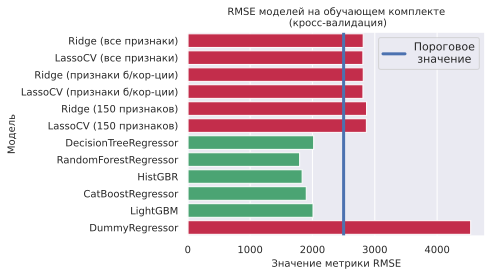

In [304]:
bar_values = ml_results['RMSE']
bar_color = ['mediumseagreen' if (x < 2500) else 'crimson' for x in bar_values ]

c = sns.barplot(data = ml_results,
    x = 'RMSE',
    y = 'Модель',
    palette = bar_color)
sns.set(rc={'figure.figsize':(7,4)})
c.axes.set_title('RMSE моделей на обучающем комплекте\n (кросс-валидация)',fontsize=10)
c.set_xlabel('Значение метрики RMSE',fontsize=10)
c.set_ylabel('Модель',fontsize=10)
c.tick_params(labelsize=10)
plt.axvline(2500, linewidth = 3, label = 'Пороговое\n значение')
plt.legend()
plt.tight_layout()
plt.show()

## **<font color='mediumblue'>ВЫВОДЫ по 3 Анализ результатов тестирования моделей</font>**

---

**(1)** самое низкое значение метрики RMSE на обучающем комплекте при кросс-валидации получено для модели RandomForestRegressor:

In [293]:
print('RMSE модели RandomForestRegressor на обучащей выборке:\n',
      rmse_forest)

RMSE модели RandomForestRegressor на обучащей выборке:
 1794.409


Однако модель затратила значительное количество времени на обучение и предсказание:

In [294]:
print('Время обучения модели RandomFirestRegressor:\n',
      forest_time_spent)

Время обучения модели RandomFirestRegressor:
 0:25:15.820948


**(2)** второе место по метрике RMSE получила модель HistGradientBoostingRegressor:

In [295]:
print('RMSE модели HistGradientBoostingRegressor на обучащей выборке:\n',
      rmse_hist)

RMSE модели HistGradientBoostingRegressor на обучащей выборке:
 1834.337


При этом время, которое модель затратила на обучение и предсказание, очень невелико:

In [296]:
print('Время обучения модели HistGradientBoostingRegressor:\n',
      hist_time_spent)

Время обучения модели HistGradientBoostingRegressor:
 0:01:28.299139




**(3)** модель HistGradientBoostingRegressor в разы превосходит модель RandomForestRegressor по скорости обучения и предсказания, лишь незначительно уступая по величине метрики RMSE. В связи с этим для тестовой проверки будет отобрана модель HistGradientBoostingRegressor

**(4)** модель DummyRegressor показала самую большую ошибку. Все исследованные модели показали значение метрики RMSE меньше, чем DummyRegressor

## <font color='green'>**4 Проверка лучшей модели на тестовой выборке**</font>

---

Для проверки на тестовой выборке отобрана модель HistGradientBoostingRegressor. Проверим ее качество на тестовом комлпекте.

In [297]:
start = datetime.now()
# получаем предсказания модели
hist_predictions = best_model_hist.predict(
    features_test_complex)
hist_time_spent_test = datetime.now() - start
print('Время предсказания модели HistGradientBoostingRegressor на тестовой выборке:\n', \
      hist_time_spent_test)

Время предсказания модели HistGradientBoostingRegressor на тестовой выборке:
 0:00:00.429325


In [298]:
# вычисляем размер метрики RMSE
rmse_hist_test = round(
    mean_squared_error(
        target_test_complex,
        hist_predictions) ** (1/2), 3)

print('RMSE модели HistGradientBoostingRegressor на тестовой выборке:\n', \
      rmse_hist_test)

RMSE модели HistGradientBoostingRegressor на тестовой выборке:
 1844.756


RMSE модели HistGradientBoostingRegressor на обучающей выборке составила 1858.973. Ошибка на тестовой выборке превысила ошибку на обучающей выборке на 9.588, что в сопоставлении с общим размером ошибки является незначительной величиной.

Следовательно, для модели HistGradientBoostingRegressor достигнуто оптимальное сочетание, она не является ни переобученной, ни недообученной. **Модель соответствует требованиям заказчика**.

Дополнительно рассчитаем значение метрики RMSE для модели DummyClassifier на тестовой выборке.


In [299]:
start = datetime.now()
# получаем предсказания модели
dummy_predictions_test = model_dummy.predict(
    features_test_complex)
dummy_time_spent_test = datetime.now() - start
print('Время предсказания модели DummyRegressor на тестовой выборке:\n', \
      dummy_time_spent_test)

Время предсказания модели DummyRegressor на тестовой выборке:
 0:00:00.000387


In [300]:
# вычисляем размер метрики RMSE
rmse_dummy_test = round(
    mean_squared_error(
        target_test_complex,
        dummy_predictions_test) ** (1/2), 3)

print('RMSE модели DummyRegressor на тестовой выборке:\n', \
      rmse_dummy_test)

RMSE модели DummyRegressor на тестовой выборке:
 4557.438


Ошибка модели DummyRegressor на тестовых данных более чем в два раза превышает ошибку лучшей модели HistGradientBoostingRegressor, что подтверждает качество обучения лучшей модели.

## **<font color='mediumblue'>ВЫВОДЫ по 4 Проверка лучшей модели на тестовой выборке</font>**

---

**(1)** модель HistGradientBoostingRegressor успешно прошла проверку на тестовой выборке. Ошибка на тестовой выборке по сравнению с ошибкой на обучающей выборке увеличилась незначительно:

In [301]:
hist_results = pd.DataFrame(
    {'1': ['RMSE на обучающей выборке', rmse_hist],
     '2': ['RMSE на тестовой выборке', rmse_hist_test],
     '3': ['Разница между RMSE на тестовой и обучающей выборке',
           (rmse_hist_test - rmse_hist)],
     }
)

hist_results = hist_results.T
hist_results.columns = ['Характеристика RMSE',
                      'Величина']
hist_results

,Характеристика RMSE,Величина
1,RMSE на обучающей выборке,1834.337
2,RMSE на тестовой выборке,1844.756
3,Разница между RMSE на тестовой и обучающей выб...,10.419


**(2)** модель HistGradientBoostingRegressor показала себя экономичной с точки зрения затрат времени на обучение и получение предсказаний на обучающей выборке. Время получения предсказаний на тестовой выборке составило менее половины секунды.

**(3)** метрика RMSE модели HistGradientBoostingRegressor на тестовых данных более чем в два раза лучше метрики модели DummyRegressor, традиционно используемой для оценки качества моделей в задачах регрессии.

**(4)** модель HistGradientBoostingRegressor **полностью соответствует требованиям заказчика**.

# **<font color='crimson'>ИТОГОВЫЕ ВЫВОДЫ ПО ПРОЕКТУ «Определение рыночной стоимости автомобилей»</font>**

**(1)** в ходе исследовательского анализа данных проведена необходимая предподготовка: исследован каждый из признаков датасета, удалены неинформативные признаки, обработаны выбросы; удалены наблюдения с указанной очень низкой стоимостью автомобиля; удалены явные дубликаты

**(2)** для заполнения пропущенных значений в числовых признаках применен метод KNNImputer, в категориальных - SimpleImputer

**(3)** с точки зрения подхода к кодированию и масштабированию признаков исследуемые модели разделены на два типа: простые (линейные) модели и сложные (основанные на решающих деревьях) модели. К простым моделям применены OneHotEncoder и MinMaxScaler. К сложным моделям применен OrdinalEncoder

**(4)** простые (линейные) модели, которые были проверены во время выполнения исследования:

 * Ridge

 * LassoCV

**(5)** с учетом специфики линейных моделей для расширения границ эксперимента было создано три обучающих комплекта для Ridge и LassoCV:

 * с полным набором признаков

 * с набором признаков, из которого были удалены признаки с высоким уровнем линейной корреляции

 * с набором признаков, включающим 150 важнейших признаков, отобранных с помощью SelektKBest

**(6)** сложные (основанные на решающих деревьях) модели, которые были проверены во время выполнения исследования:

 * DecisionTreeRegessor

 * RandomForestRegressor

 * HistGradientBoostingRegressor

 * CatBoostRegressor

 * LGBMRegressor

Три последние указанные модели относятся к моделям семейства **градиентного бустинга**

**(7)** создана собственная метрика rmse, позволившая получать значение метрики по итогам кросс-валидации на RandomizedSearchCV с помощью атрибута best_score_

**(8)** для выявления лучшей модели проведено двенадцать экспериментов, в том числе определено значение метрики RMSE для модели DummyRegressor

**(9)** результаты экспериментов по определению лучшей модели представлены в таблице и на рисунке:

In [302]:
ml_results

,Модель,Время обучения и предсказания,RMSE
1,Ridge (все признаки),0:08:56.494821,2813.773
2,LassoCV (все признаки),0:05:10.532565,2808.801
3,Ridge (признаки б/кор-ции),0:09:00.970099,2814.685
4,LassoCV (признаки б/кор-ции),0:03:57.027074,2809.738
5,Ridge (150 признаков),0:03:44.064643,2867.803
6,LassoCV (150 признаков),0:00:18.058261,2864.771
7,DecisionTreeRegressor,0:00:16.189769,2019.564
8,RandomForestRegressor,0:25:15.820948,1794.409
9,HistGBR,0:01:28.299139,1834.337
10,CatBoostRegressor,0:02:14.139381,1900.598


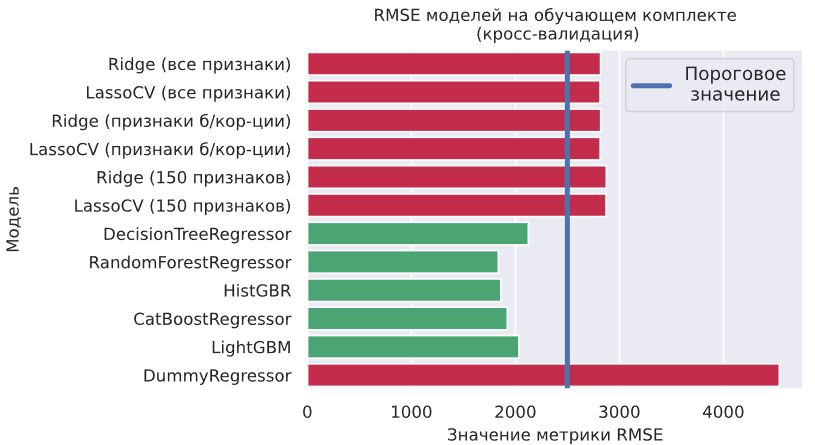

**(10)** ни в одном из случаев проверки простых (линейных) моделей на обучающем комплекте с использованием кросс-валидации не было получено значение метрики RMSE, которое соответствовало бы пороговому уровню в 2500. Удаление коррелирующих признаков и выявление 150-ти важнейших признаков не позволило снизить RMSE

**(11)** все пять ‘сложных’ (основанных на решающих деревьях) моделей на обучающей выборке с использованием кросс-валидации показали значение метрики RMSE меньшее, чем 2500

**(12)** лучшей моделью, соответствующей ограничениям, установленным в техзадании, стала модель **HistGradientBoostingRegressor**, показавшая следующий результат на тестовой выборке:

In [303]:
hist_results

,Характеристика RMSE,Величина
1,RMSE на обучающей выборке,1834.337
2,RMSE на тестовой выборке,1844.756
3,Разница между RMSE на тестовой и обучающей выб...,10.419


**(13)** все без исключения проверенные модели показали значение метрики RMSE значительно меньше, чем DummyRegressor